In [1]:
#Install OPENCV
#!pip install opencv-python
#!pip list

Package                       Version
----------------------------- --------------------
alabaster                     0.7.12
anaconda-client               1.11.0
anaconda-navigator            2.3.1
anaconda-project              0.11.1
anyio                         3.5.0
appdirs                       1.4.4
argon2-cffi                   21.3.0
argon2-cffi-bindings          21.2.0
arrow                         1.2.2
astroid                       2.11.7
astropy                       5.1
atomicwrites                  1.4.0
attrs                         21.4.0
Automat                       20.2.0
autopep8                      1.6.0
Babel                         2.9.1
backcall                      0.2.0
backports.functools-lru-cache 1.6.4
backports.tempfile            1.0
backports.weakref             1.0.post1
bcrypt                        3.2.0
beautifulsoup4                4.11.1
binaryornot                   0.4.4
bitarray                      2.5.1
bkcharts                      0.2
blac

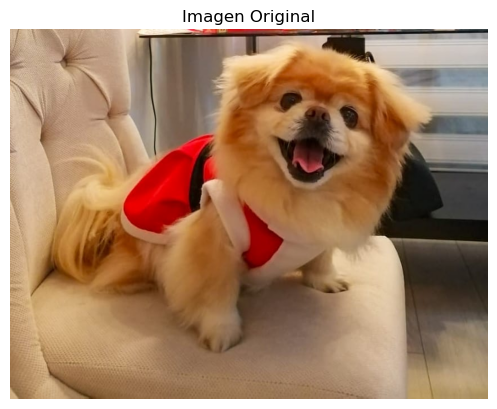

Tamaño del descriptor HOG: (25072740,)
Descriptor HOG: [0.1138267  0.06804292 0.0453371  ... 0.0139725  0.0025477  0.00765517]


In [8]:
#Histograma de gradientes HOG 
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Carga de la imagen
image = cv2.imread("sim_data-master/images/dog.jpeg")

# Convierte la imagen a escala de grises
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Crea un objeto HOGDescriptor y un descriptor HOG
hog = cv2.HOGDescriptor()
hog_descriptor = hog.compute(gray_image)

# Visualización de la imagen original
plt.figure()
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Imagen Original')
plt.axis('off')
plt.show()

# Imprime las características del HOG
print("Tamaño del descriptor HOG:", hog_descriptor.shape)
print("Descriptor HOG:", hog_descriptor)

In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Carga de la imagen
image = cv2.imread("sim_data-master/images/dog.jpeg")

# Convierte la imagen a escala de grises
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Crea un objeto HOGDescriptor
hog = cv2.HOGDescriptor()

# Calcula el descriptor HOG
hog_descriptor = hog.compute(gray_image)

# Extrae las orientaciones de gradientes del HOG
orientations = hog_descriptor[:, 0].reshape(gray_image.shape)

# Muestra la imagen original
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Imagen Original')
plt.axis('off')

# Muestra las orientaciones de gradientes del HOG
plt.subplot(1, 2, 2)
plt.imshow(orientations, cmap='hsv')
plt.title('Orientaciones de Gradientes HOG')
plt.axis('off')

plt.tight_layout()
plt.show()

IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

In [21]:
b=hog_descriptor.shape

a=gray_image.shape

In [33]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread("sim_data-master/images/dog.jpeg")

# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Create a HOGDescriptor object
hog = cv2.HOGDescriptor()

# Calculate the HOG descriptor
hog_descriptor = hog.compute(gray_image)

# Calculate the dimensions of the grid
win_size = hog.winSize
cell_size = hog.cellSize
block_size = hog.blockSize
n_cells = (win_size[0] // cell_size[0], win_size[1] // cell_size[1])
n_blocks = (n_cells[0] - block_size[0] + 1, n_cells[1] - block_size[1] + 1)

# Reshape the orientations to match the grid structure
orientations = orientations.reshape(n_blocks[0], n_blocks[1], block_size[0], block_size[1], cell_size[0], cell_size[1])

# Muestra la imagen original
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Imagen Original')
plt.axis('off')

# Muestra las orientaciones de gradientes del HOG
plt.subplot(1, 2, 2)
plt.imshow(orientations.mean(axis=(4, 5)).mean(axis=(2, 3)), cmap='hsv')
plt.title('Orientaciones de Gradientes HOG')
plt.axis('off')

plt.tight_layout()
plt.show()

NameError: name 'orientations' is not defined

**Basic image processing**: Gray scale and color images

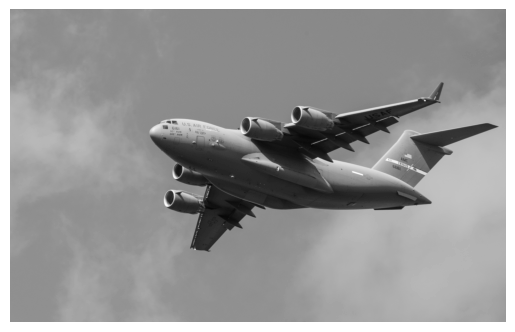

In [1]:
# Load library
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load image as grayscale
image = cv2.imread("sim_data-master/images/plane.jpg", cv2.IMREAD_GRAYSCALE)

# Show image
plt.imshow(image, cmap="gray"), plt.axis("off")
plt.show()

In [2]:
# Fundamentally, images are data and when we use imread we convert that data into a 
# data type we are very familiar with—a NumPy array

# Show data type
type(image)

numpy.ndarray

In [4]:
#We have transformed the image into a matrix whose elements correspond to individual pixels. 
#We can even take a look at the actual values of the matrix:
image

array([[140, 136, 146, ..., 132, 139, 134],
       [144, 136, 149, ..., 142, 124, 126],
       [152, 139, 144, ..., 121, 127, 134],
       ...,
       [156, 146, 144, ..., 157, 154, 151],
       [146, 150, 147, ..., 156, 158, 157],
       [143, 138, 147, ..., 156, 157, 157]], dtype=uint8)

In [5]:
#The resolution of our image was 3600 × 2270, the exact dimensions of our matrix
# Show dimensions
image.shape

(2270, 3600)

In [6]:
#In grayscale images, the value of an individual element is the pixel intensity. 
#Intensity values range from black (0) to white (255).
# Show first pixel
image[0,0]

140

In [7]:
#In the matrix, each element contains three values corresponding to blue, green, red values (BGR)
# Load image in color
image_bgr = cv2.imread("sim_data-master/images/plane.jpg", cv2.IMREAD_COLOR)
# Show pixel
image_bgr[0,0]

array([195, 144, 111], dtype=uint8)

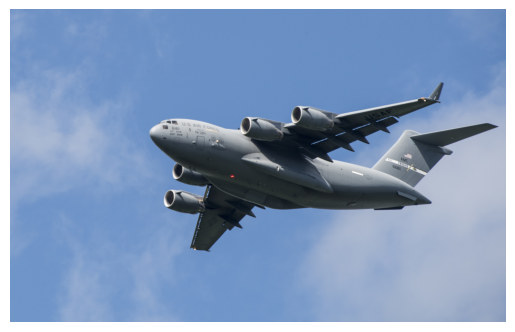

In [8]:
#One small caveat: by default OpenCV uses BGR, but many image applications—
#including Matplotlib—use red, green, blue (RGB), meaning the red and the blue
#values are swapped. To properly display OpenCV color images in Matplotlib, we need
#to first convert the color to RGB 

# Convert to RGB
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
# Show image
plt.imshow(image_rgb), plt.axis("off")
plt.show()

In [9]:
# Show dimensions
image_rgb.shape

(2270, 3600, 3)

In [10]:
#SAVE images 
    
#Load libraries
import cv2
import numpy as np
from matplotlib import pyplot as plt
# Load image as grayscale
image = cv2.imread("sim_data-master/images/plane.jpg", cv2.IMREAD_GRAYSCALE)
# Save image
cv2.imwrite("sim_data-master/images/plane_new.jpg", image)

True

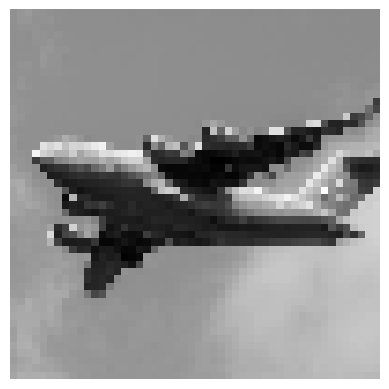

In [11]:
# Resizing Images

# Load image
import cv2
import numpy as np
from matplotlib import pyplot as plt
# Load image as grayscale
image = cv2.imread("sim_data-master/images/plane_256x256.jpg", cv2.IMREAD_GRAYSCALE)
# Resize image to 50 pixels by 50 pixels
image_50x50 = cv2.resize(image, (50, 50))
# View image
plt.imshow(image_50x50, cmap="gray"), plt.axis("off")
plt.show()

# NOTE: machine learning can require thousands or hundreds of thousands of images. When
#those images are very large they can take up a lot of memory, and by resizing them we
#can dramatically reduce memory usage. Some common image sizes for machine
#learning are 32 × 32, 64 × 64, 96 × 96, and 256 × 256.

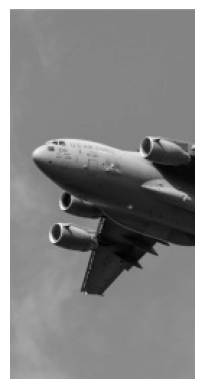

In [12]:
#Cropping Images

#Since OpenCV represents images as a matrix of elements, by selecting the rows and
#columns we want to keep we are able to easily crop the image. Cropping can be par‐
#ticularly useful if we know that we only want to keep a certain part of every image.

# Load image
import cv2
import numpy as np
from matplotlib import pyplot as plt
# Load image in grayscale
image = cv2.imread("sim_data-master/images/plane_256x256.jpg", cv2.IMREAD_GRAYSCALE)
# Select first half of the columns and all rows
image_cropped = image[:,:128]
# Show image
plt.imshow(image_cropped, cmap="gray"), plt.axis("off")
plt.show()

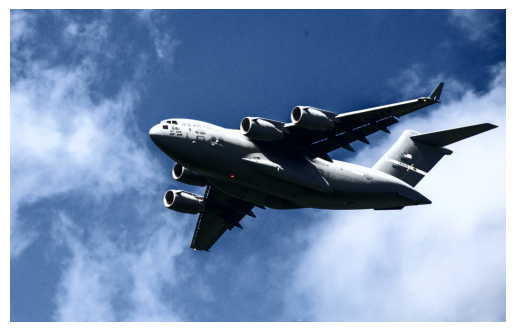

In [13]:
# Load image
image_bgr = cv2.imread("sim_data-master/images/plane.jpg")
# Convert to YUV
image_yuv = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2YUV)
# Apply histogram equalization
image_yuv[:, :, 0] = cv2.equalizeHist(image_yuv[:, :, 0])
# Convert to RGB
image_rgb = cv2.cvtColor(image_yuv, cv2.COLOR_YUV2RGB)
# Show image
plt.imshow(image_rgb), plt.axis("off")
plt.show()

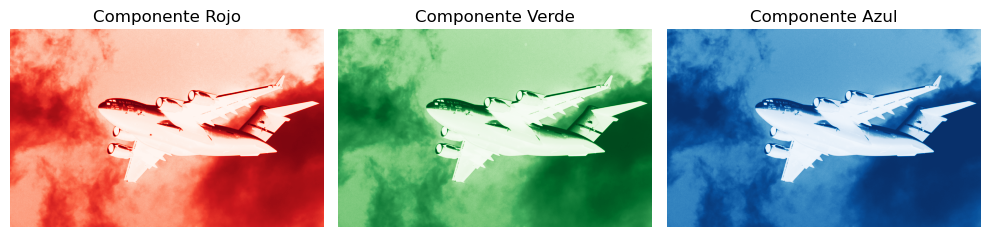

In [14]:
#Show RGB image components

imagen = image_rgb

# Dividir la imagen en sus componentes RGB
rojo = imagen[:, :, 0]
verde = imagen[:, :, 1]
azul = imagen[:, :, 2]

# Mostrar los componentes RGB
plt.figure(figsize=(10, 4))

plt.subplot(131)
plt.imshow(rojo, cmap='Reds')
plt.title('Componente Rojo')
plt.axis('off')

plt.subplot(132)
plt.imshow(verde, cmap='Greens')
plt.title('Componente Verde')
plt.axis('off')

plt.subplot(133)
plt.imshow(azul, cmap='Blues')
plt.title('Componente Azul')
plt.axis('off')

plt.tight_layout()
plt.show()

In [15]:
#RGB to YUV

import colorsys

#Show RGB image components

imagen = image_rgb

def rgb_to_yuv(r, g, b):
    y, u, v = colorsys.rgb_to_yiq(r / 255.0, g / 255.0, b / 255.0)
    y *= 255
    u = (u + 0.595716) * 255
    v = (v + 0.522591) * 255
    return y, u, v

imagen = image_rgb

# Dividir la imagen en sus componentes RGB
r = imagen[:, :, 0]
g = imagen[:, :, 1]
b = imagen[:, :, 2]

r, g, b = 255, 0, 0  # Example RGB values
y, u, v = rgb_to_yuv(r, g, b)
print("YUV values:", y, u, v)


YUV values: 76.5 304.65258 187.575705


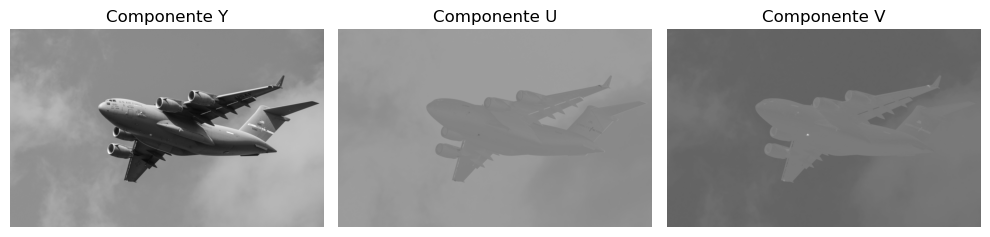

In [16]:
#RGB to YUV image
import cv2

# Load image
rgb_image = cv2.imread("sim_data-master/images/plane.jpg")

# Convert RGB image to YUV
yuv_image = cv2.cvtColor(rgb_image, cv2.COLOR_BGR2YUV)

# Save the YUV image
cv2.imwrite('output_yuv_image.jpg', yuv_image)
yuv_bgr = cv2.imread('output_yuv_image.jpg')

# Split YUV image into components
y_component, u_component, v_component = cv2.split(yuv_image)

# Save each YUV component as individual images
cv2.imwrite('y_component.jpg', y_component)
cv2.imwrite('u_component.jpg', u_component)
cv2.imwrite('v_component.jpg', v_component)

Y_bgr = cv2.imread('y_component.jpg')
Y_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
U_bgr = cv2.imread('u_component.jpg')
U_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
V_bgr = cv2.imread('v_component.jpg')
V_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Mostrar los componentes RGB
plt.figure(figsize=(10, 4))

plt.subplot(131)
plt.imshow(Y_bgr)
plt.title('Componente Y')
plt.axis('off')

plt.subplot(132)
plt.imshow(U_bgr)
plt.title('Componente U')
plt.axis('off')

plt.subplot(133)
plt.imshow(V_bgr)
plt.title('Componente V')
plt.axis('off')

plt.tight_layout()
plt.show()

**FILTROS**

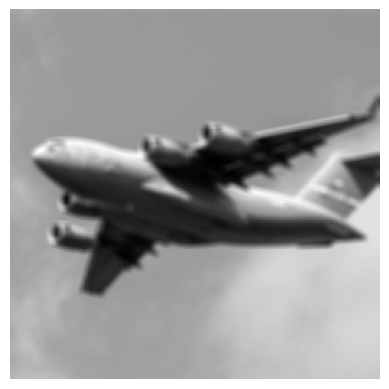

In [17]:
# Blurring Images

#To blur an image, each pixel is transformed to be the average value of its neighbors.
#This neighbor and the operation performed are mathematically represented as a kernel
#The size of this kernel determines the amount of blurring, with larger kernels producing smoother images. 
#Here we blur an image by averaging the values of a 5 × 5 kernel around each pixel:

# Load libraries
import cv2
import numpy as np
from matplotlib import pyplot as plt
# Load image as grayscale
image = cv2.imread("sim_data-master/images/plane_256x256.jpg", cv2.IMREAD_GRAYSCALE)
# Blur image
image_blurry = cv2.blur(image, (5,5))
# Show image
plt.imshow(image_blurry, cmap="gray"), plt.axis("off")
plt.show()

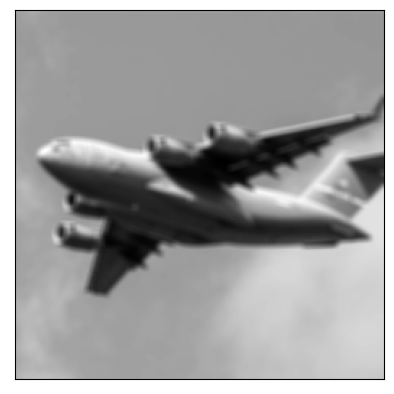

In [28]:
#To highlight the effect of kernel size, here is the same blurring with a 100 × 100 kernel:
# Blur image
image_very_blurry = cv2.blur(image, (5,5))
# Show image
plt.imshow(image_very_blurry, cmap="gray"), plt.xticks([]), plt.yticks([])
plt.show()

In [26]:
#Kernels are widely used in image processing to do everything from sharpening to
#edge detection. The blurring kernel we used looks like this:

# Create kernel
kernel = np.ones((5,5)) / 25.0
# Show kernel
kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]])

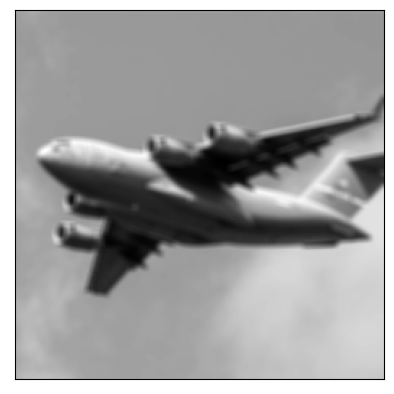

In [27]:
#The center element in the kernel is the pixel being examined, while the remaining ele‐
#ments are its neighbors. Since all elements have the same value (normalized to add up
#to 1), each has an equal say in the resulting value of the pixel of interest. 

#We can manually apply a kernel to an image using filter2D to produce a similar blurring effect:

# Apply kernel
image_kernel = cv2.filter2D(image, -1, kernel)


# Syntax: filter2D (src, dst, ddepth, kernel)

# Parameters:  
# Src – The source image to apply the filter on.
# Dst – Name of the output image after applying the filter
# Ddepth – Depth of the output image [ -1 will give the output image depth as same as the input image]
# Kernel – The 2d matrix we want the image to convolve with.

# Show image
plt.imshow(image_kernel, cmap="gray"), plt.xticks([]), plt.yticks([])
plt.show()

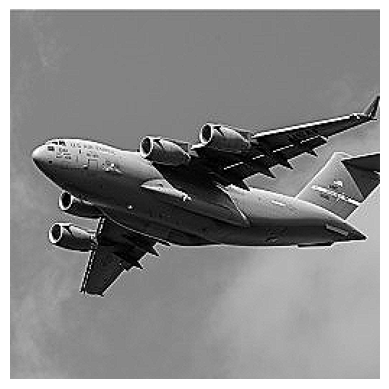

In [29]:
#Sharpening Images
 # Load libraries
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load image as grayscale
image = cv2.imread("sim_data-master/images/plane_256x256.jpg", cv2.IMREAD_GRAYSCALE)
# Create kernel
kernel = np.array([[0, -1, 0],
                   [-1, 5,-1],
                   [0, -1, 0]])
# Sharpen image
image_sharp = cv2.filter2D(image, -1, kernel)
# Show image
plt.imshow(image_sharp, cmap="gray"), plt.axis("off")
plt.show()

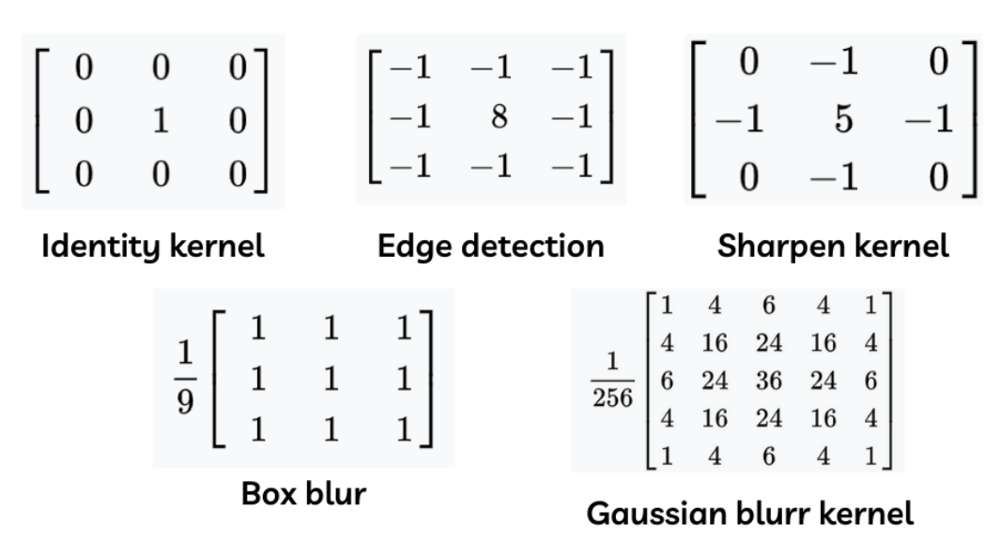


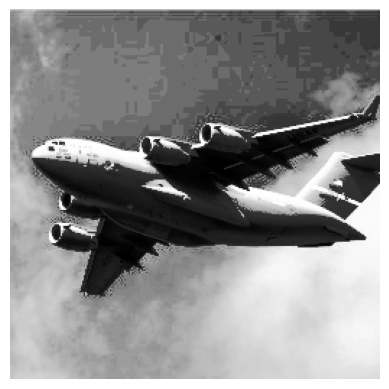

In [30]:
#  Enhancing Contrast - We want to increase the contrast between pixels in an image.

# Histogram equalization is a tool for image processing that can make objects and
# shapes stand out. When we have a grayscale image, we can apply OpenCV’s equali
# zeHist directly on the image:

# Load libraries
import cv2
import numpy as np
from matplotlib import pyplot as plt
# Load image
image = cv2.imread("sim_data-master/images/plane_256x256.jpg", cv2.IMREAD_GRAYSCALE)
# Enhance image
image_enhanced = cv2.equalizeHist(image) # it transforms the image so that it uses a wider range of pixel intensities
# Show image
plt.imshow(image_enhanced, cmap="gray"), plt.axis("off")
plt.show()

However, when we have a color image, we first need to convert the image to the YUV color format. The Y is the luma, or brightness, and U and V denote the color. 


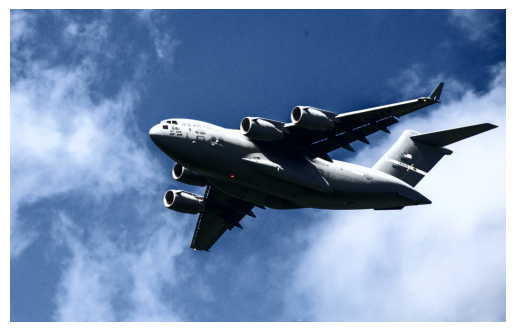

In [31]:
# After the conversion, we can apply equalizeHist to the image and then convert it back to
# BGR or RGB:

# Load image
image_bgr = cv2.imread("sim_data-master/images/plane.jpg")
# Convert to YUV
image_yuv = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2YUV)
# Apply histogram equalization
image_yuv[:, :, 0] = cv2.equalizeHist(image_yuv[:, :, 0])
# Convert to RGB
image_rgb = cv2.cvtColor(image_yuv, cv2.COLOR_YUV2RGB)
# Show image
plt.imshow(image_rgb), plt.axis("off")
plt.show()

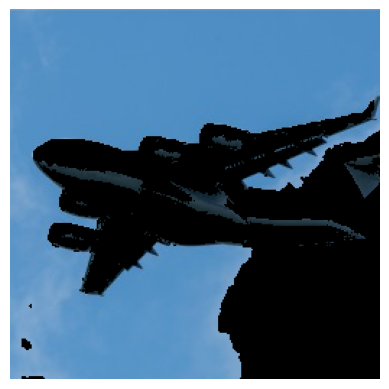

In [32]:
#  Isolating Colors - Define a range of colors and then apply a mask to the image

# First we convert an image into HSV (hue, saturation, and value). 
# Second, we define a range of values we want to isolate, which is probably the most difficult and time-consuming part. 
# Third, we create a mask for the image (we will only keep the white areas):

# Load libraries
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load image
image_bgr = cv2.imread('sim_data-master/images/plane_256x256.jpg')

# Convert BGR to HSV
image_hsv = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2HSV)

# Define range of blue values in HSV
lower_blue = np.array([50,100,50])
upper_blue = np.array([130,255,255])

# Create mask
mask = cv2.inRange(image_hsv, lower_blue, upper_blue)

# Mask image
image_bgr_masked = cv2.bitwise_and(image_bgr, image_bgr, mask=mask)

# Convert BGR to RGB
image_rgb = cv2.cvtColor(image_bgr_masked, cv2.COLOR_BGR2RGB)

# Show image
plt.imshow(image_rgb), plt.axis("off")
plt.show()

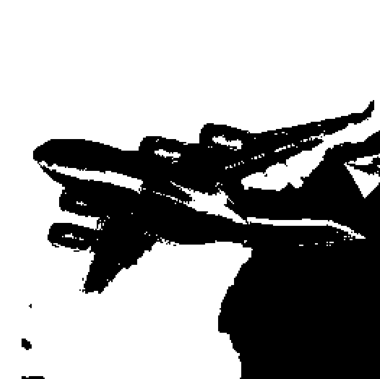

In [33]:
#Finally, we apply the mask to the image using bitwise_and and convert to our desired output format.

# Show image
plt.imshow(mask, cmap='gray'), plt.axis("off")
plt.show()

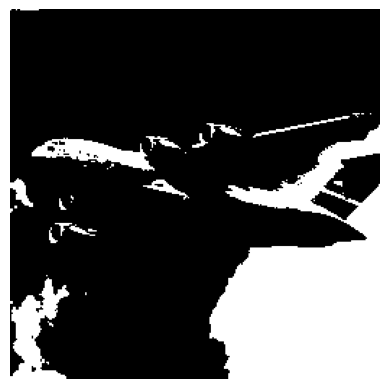

In [39]:
#Binarizing Images - Given an image, you want to output a simplified version.

# Tresholding is the process of setting pixels with intensity greater than some value to
# be white and less than the value to be black. 

# Load the image in grayscale
image = cv2.imread('sim_data-master/images/plane_256x256.jpg', cv2.IMREAD_GRAYSCALE)

# Define the threshold value
threshold_value = 150

# Apply hard thresholding
ret, thresholded_image = cv2.threshold(image, threshold_value, 255, cv2.THRESH_BINARY)

# Show image
plt.imshow(thresholded_image, cmap="gray"), plt.axis("off")
plt.show()

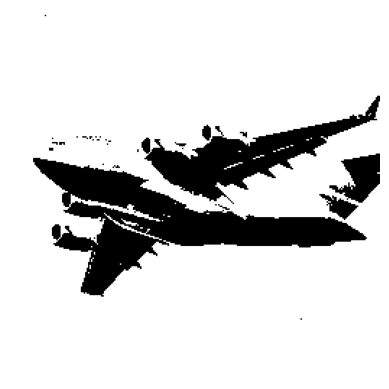

In [40]:
# A more advanced technique is adaptive
# thresholding, where the threshold value for a pixel is determined by the pixel intensi‐
# ties of its neighbors. This can be helpful when lighting conditions change over differ‐
# ent regions in an image

# Load libraries
import cv2
import numpy as np
from matplotlib import pyplot as plt
# Load image as grayscale
image_grey = cv2.imread("sim_data-master/images/plane_256x256.jpg", cv2.IMREAD_GRAYSCALE)

# Apply adaptive thresholding
max_output_value = 255
neighborhood_size = 99
subtract_from_mean = 10
image_binarized = cv2.adaptiveThreshold(image_grey,
 max_output_value,
cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
cv2.THRESH_BINARY,
neighborhood_size,
subtract_from_mean)
# Show image
plt.imshow(image_binarized, cmap="gray"), plt.axis("off")
plt.show()

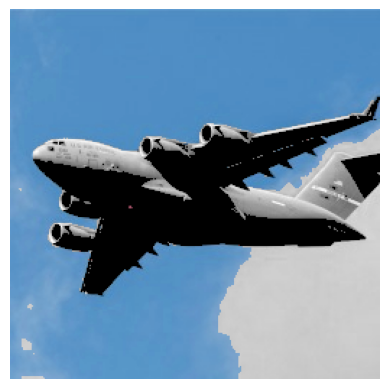

In [41]:
#Hard threshold in color image using HSV

# Load the color image
image = cv2.imread('sim_data-master/images/plane_256x256.jpg')

# Convert the image to the HSV color space
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Define the threshold values for each channel (H, S, V)
h_threshold = 100  # Example threshold for H channel
s_threshold = 100  # Example threshold for S channel
v_threshold = 100  # Example threshold for V channel

# Apply hard thresholding to each channel
hsv_image[:, :, 0] = np.where(hsv_image[:, :, 0] > h_threshold, hsv_image[:, :, 0], 0)
hsv_image[:, :, 1] = np.where(hsv_image[:, :, 1] > s_threshold, hsv_image[:, :, 1], 0)
hsv_image[:, :, 2] = np.where(hsv_image[:, :, 2] > v_threshold, hsv_image[:, :, 2], 0)

# Convert the modified HSV image back to BGR color space
thresholded_image = cv2.cvtColor(hsv_image, cv2.COLOR_HSV2RGB)

# Show image
plt.imshow(thresholded_image), plt.axis("off")
plt.show()


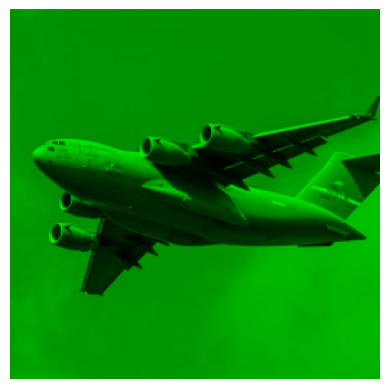

In [47]:
#Hard threshold in color image using RGB

# Load the color image
image = cv2.imread('sim_data-master/images/plane_256x256.jpg')

# Define the threshold values for each channel (R, G, B)  # CHANGE THESE VALUES
# Each value greater than the threshold will be replaced by 0

r_threshold = 255  # Example threshold for R channel   
g_threshold = 0  # Example threshold for G channel
b_threshold = 255  # Example threshold for B channel

# # Split the image into its RGB channels
r_channel, g_channel, b_channel = cv2.split(image)

# Apply hard thresholding to each channel
r_channel = np.where(r_channel > r_threshold, r_channel, 0)
g_channel = np.where(g_channel > g_threshold, g_channel, 0)
b_channel = np.where(b_channel > b_threshold, b_channel, 0)

# Merge the modified channels back into an RGB image
thresholded_image = cv2.merge((r_channel, g_channel, b_channel))

# Show image
plt.imshow(thresholded_image), plt.axis("off")
plt.show()

**Histogram for each color channel**

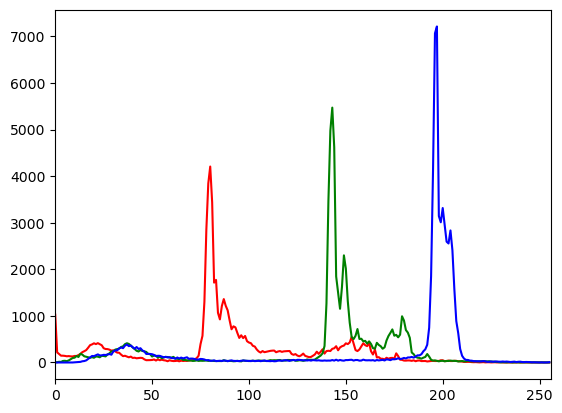

In [48]:
# Calculate the histogram for each color channel

# Load libraries
import cv2
import numpy as np
from matplotlib import pyplot as plt
# Load image
image_bgr = cv2.imread("sim_data-master/images/plane_256x256.jpg", cv2.IMREAD_COLOR)
# Convert to RGB
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

colors = ("r","g","b")
# For each channel: calculate histogram, make plot
for i, channel in enumerate(colors):
     histogram = cv2.calcHist([image_rgb], # Image
     [i], # Index of channel
     None, # No mask
     [256], # Histogram size
     [0,256]) # Range
     plt.plot(histogram, color = channel)
     plt.xlim([0,256])
# Show plot
plt.show()

**Histogram Equalization:**
Enhances image contrast by redistributing pixel values in the histogram.

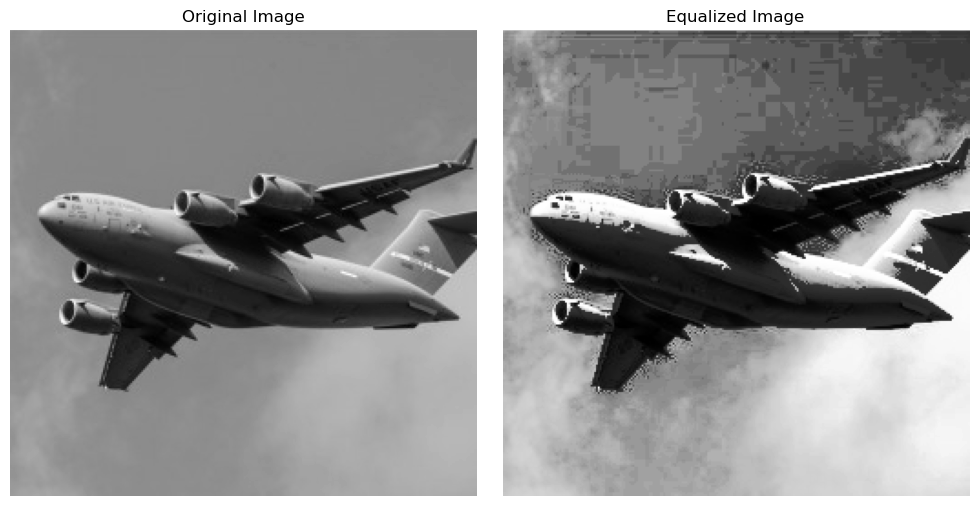

In [49]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color

# Load image
image_bgr = cv2.imread("sim_data-master/images/plane_256x256.jpg", cv2.IMREAD_COLOR)
# Convert to RGB
image = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

if len(image.shape) > 2:
    image = color.rgb2gray(image)

equalized_image = cv2.equalizeHist(np.uint8(image * 255))
    
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(equalized_image, cmap='gray')
plt.title('Equalized Image')
plt.axis('off')

plt.tight_layout()
plt.show()

Other example of Histogram Equalization

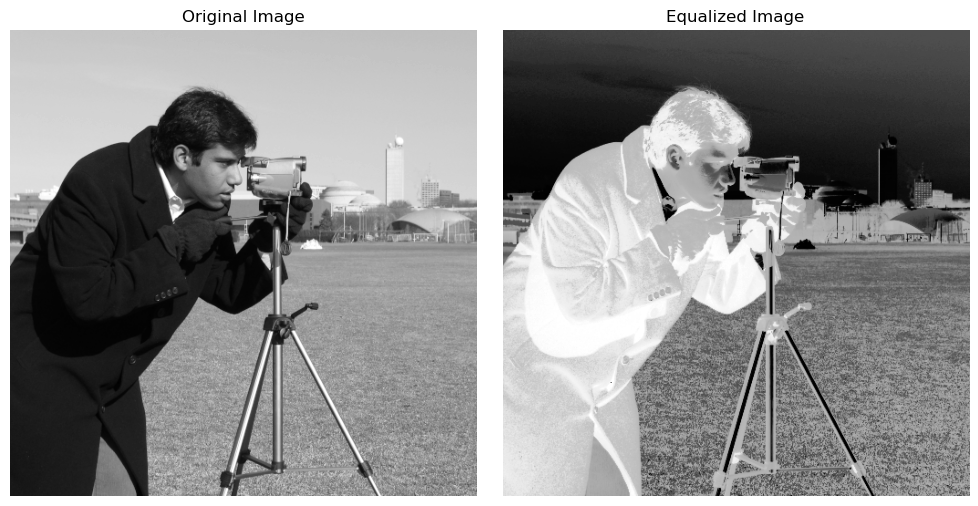

In [50]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color

image = data.camera()  # You can replace this with your own image

if len(image.shape) > 2:
    image = color.rgb2gray(image)

equalized_image = cv2.equalizeHist(np.uint8(image * 255))

    
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(equalized_image, cmap='gray')
plt.title('Equalized Image')
plt.axis('off')

plt.tight_layout()
plt.show()

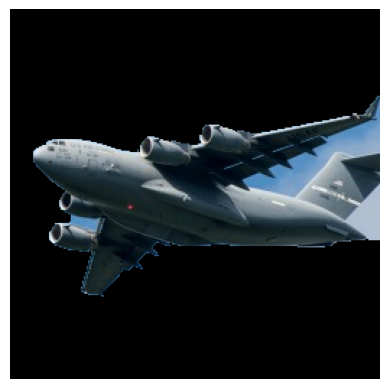

In [51]:
# Removing Backgrounds - You want to isolate the foreground of an image.

# Mark a rectangle around the desired foreground, then run the GrabCut algorithm

# Load library
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load image and convert to RGB
image_bgr = cv2.imread('sim_data-master/images/plane_256x256.jpg')
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Rectangle values: start x, start y, width, height
rectangle = (0, 56, 256, 150)

# Create initial mask
mask = np.zeros(image_rgb.shape[:2], np.uint8)

# Create temporary arrays used by grabCut
bgdModel = np.zeros((1, 65), np.float64)
fgdModel = np.zeros((1, 65), np.float64)

# Run grabCut
cv2.grabCut(image_rgb, # Our image
 mask, # The Mask
 rectangle, # Our rectangle
 bgdModel, # Temporary array for background
 fgdModel, # Temporary array for background
 5, # Number of iterations
 cv2.GC_INIT_WITH_RECT) # Initiative using our rectangle

# Create mask where sure and likely backgrounds set to 0, otherwise 1
mask_2 = np.where((mask==2) | (mask==0), 0, 1).astype('uint8')

# Multiply image with new mask to subtract background
image_rgb_nobg = image_rgb * mask_2[:, :, np.newaxis]

# Show image
plt.imshow(image_rgb_nobg), plt.axis("off")
plt.show()

The first thing we notice is that even though GrabCut did a pretty good job, there are
still areas of background left in the image. We could go back and manually mark
those areas as background, but in the real world we have thousands of images and
manually fixing them individually is not feasible. Therefore, we would do well by
simply accepting that the image data will still contain some background noise.

In our solution, we start out by marking a rectangle around the area that contains the
foreground. GrabCut assumes everything outside this rectangle to be background
and uses that information to figure out what is likely background inside the square
(to learn how the algorithm does this, check out the external resources at the end of
this solution). Then a mask is created that denotes the different definitely/likely back‐
ground/foreground regions:

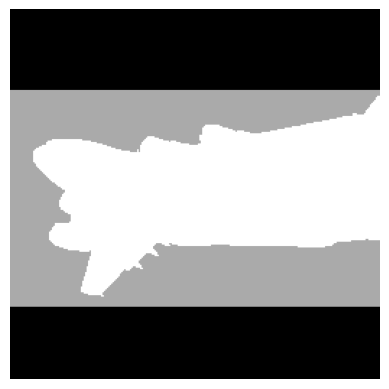

In [52]:
# Show mask
plt.imshow(mask, cmap='gray'), plt.axis("off")
plt.show()

The black region is the area outside our rectangle that is assumed to be definitely
background. The gray area is what GrabCut considered likely background, while the
white area is likely foreground

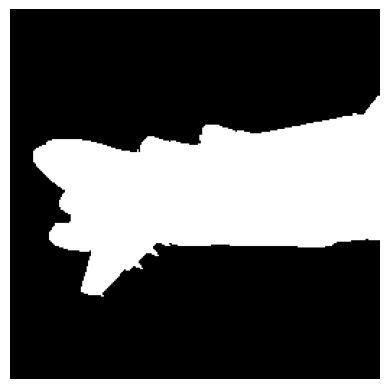

In [53]:
# Show mask
plt.imshow(mask_2, cmap='gray'), plt.axis("off")
plt.show()

This mask is then used to create a second mask that merges the black and gray
regions. The second mask is then applied to the image so that only the foreground remains

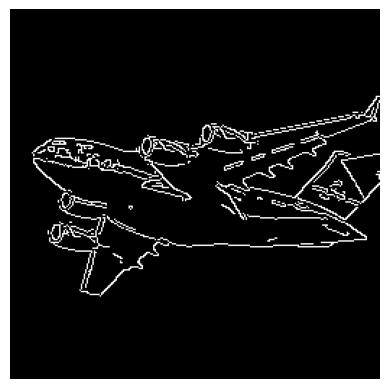

In [55]:
# Detecting Edges - Canny edge detector

# Load library
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load image as grayscale
image_gray = cv2.imread("sim_data-master/images/plane_256x256.jpg", cv2.IMREAD_GRAYSCALE)

# Calculate median intensity
median_intensity = np.median(image_gray)

# Set thresholds to be one standard deviation above and below median intensity
lower_threshold = int(max(0, (1.0 - 0.33) * median_intensity))
upper_threshold = int(min(255, (1.0 + 0.33) * median_intensity))

# Apply canny edge detector
image_canny = cv2.Canny(image_gray, lower_threshold, upper_threshold)

# Show image
plt.imshow(image_canny, cmap="gray"), plt.axis("off")
plt.show()

See also Sobel filters and Laplacian edge detectors

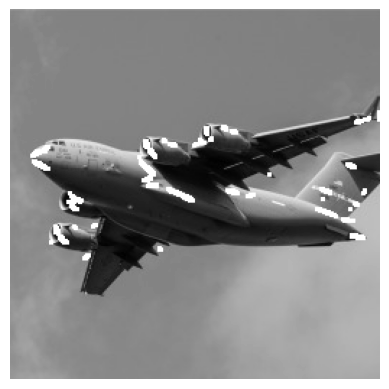

In [34]:
# Detecting Corners - Harris corner detector

# Load libraries
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load image as grayscale
image_bgr = cv2.imread("sim_data-master/images/plane_256x256.jpg")
image_gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)
image_gray = np.float32(image_gray)

# Set corner detector parameters
block_size = 2
aperture = 29
free_parameter = 0.04

# Detect corners
detector_responses = cv2.cornerHarris(image_gray,
 block_size,
aperture,
free_parameter)

# Large corner markers
detector_responses = cv2.dilate(detector_responses, None)

# Only keep detector responses greater than threshold, mark as white
threshold = 0.02
image_bgr[detector_responses >
 threshold * detector_responses.max()] = [255,255,255]

# Convert to grayscale
image_gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)

# Show image
plt.imshow(image_gray, cmap="gray"), plt.axis("off")
plt.show()

The Harris corner detector is a commonly used method of detecting the intersection of two edges. Detecting corners is motivated by the same reason as for deleting edges: corners are points of high information.

*cornerHarris* contains three important parameters that we can use to control the edges detected. First, block_size is the size of the neighbor around each pixel used for corner detection. Second, aperture is the size of the Sobel kernel used (don’t worry if you don’t know what that is), and finally there is a free parameter where larger values correspond to
identifying softer corners.

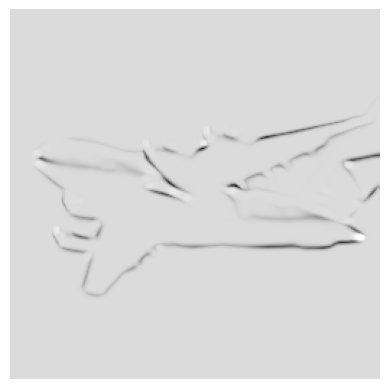

In [35]:
# Show potential corners
plt.imshow(detector_responses, cmap='gray'), plt.axis("off")
plt.show()

We then apply thresholding to keep only the most likely corners. Alternatively, we
can use a similar detector, the Shi-Tomasi corner detector, which works in a similar
way to the Harris detector (goodFeaturesToTrack) to identify a fixed number of
strong corners. goodFeaturesToTrack takes three major parameters—the number of
corners to detect, the minimum quality of the corner (0 to 1), and the minimum
Euclidean distance between corners:

A **logarithmic transformation** is a common image enhancement technique used to increase the visibility of details in darker regions of an image. It's particularly useful when the dynamic range of pixel values is skewed towards lower values.

In this code, the np.log1p() function is used to apply the logarithmic transformation to the pixel values of the image. The log1p() function calculates the natural logarithm of each pixel value plus 1, which helps handle the case where pixel values are 0. The transformed image is then normalized to the range [0, 255] to ensure it can be displayed as an image. Finally, the original and transformed images are displayed using matplotlib.

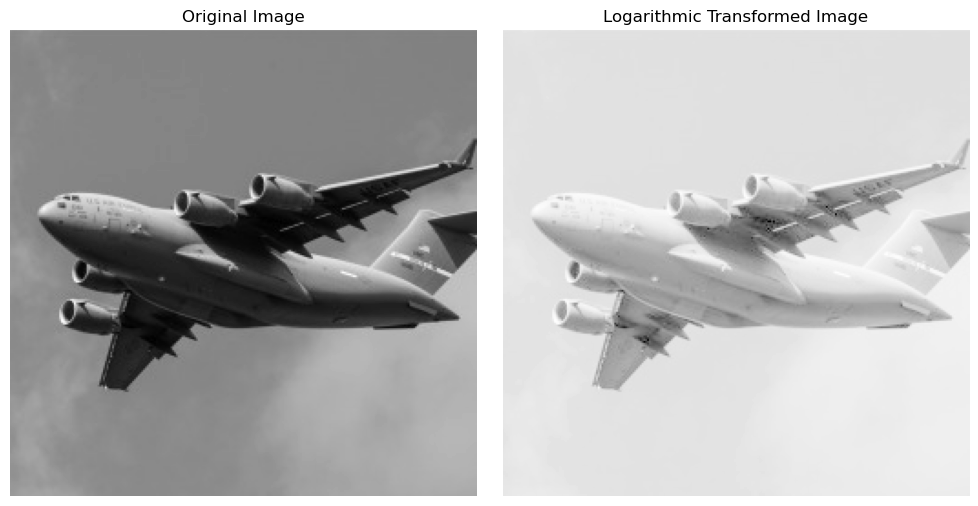

In [36]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image using OpenCV
image = cv2.imread('sim_data-master/images/plane_256x256.jpg', cv2.IMREAD_GRAYSCALE)

# Apply a logarithmic transform
log_transformed = np.log1p(image)  # Adding 1 to prevent log(0)

# Normalize the transformed image to the range [0, 255]
log_transformed = (log_transformed - np.min(log_transformed)) / (np.max(log_transformed) - np.min(log_transformed)) * 255

# Convert the data type back to uint8
log_transformed = log_transformed.astype(np.uint8)

# Display the original and transformed images using matplotlib
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(log_transformed, cmap='gray')
plt.title('Logarithmic Transformed Image')
plt.axis('off')

plt.tight_layout()
plt.show()

In [37]:
!pip install PyWavelets

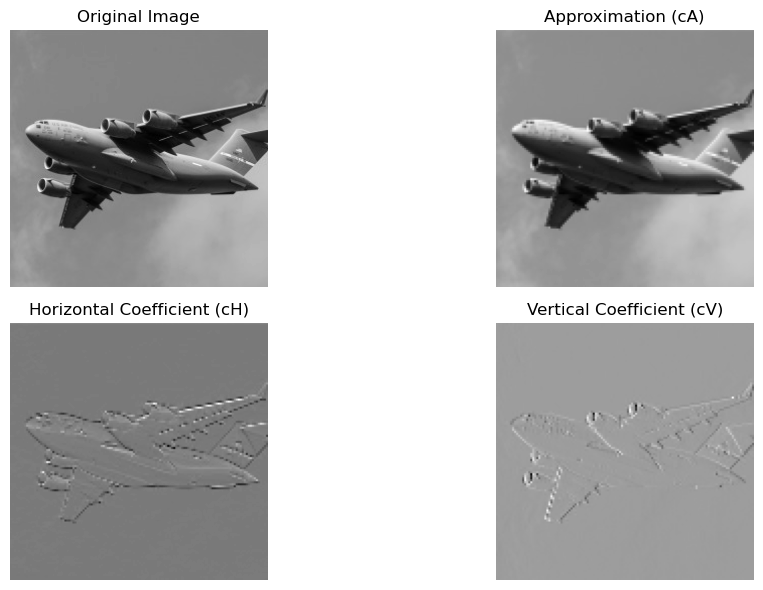

In [38]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pywt

# Load the image using OpenCV
image = cv2.imread('sim_data-master/images/plane_256x256.jpg', cv2.IMREAD_GRAYSCALE)

# Perform a 2D wavelet transform (e.g., using the Haar wavelet)
wavelet = 'haar'
coeffs = pywt.dwt2(image, wavelet)

# Get the approximation, horizontal, vertical, and diagonal coefficients
cA, (cH, cV, cD) = coeffs

# Display the original image and the wavelet coefficients using matplotlib
plt.figure(figsize=(12, 6))

plt.subplot(2, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(cA, cmap='gray')
plt.title('Approximation (cA)')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(cH, cmap='gray')
plt.title('Horizontal Coefficient (cH)')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(cV, cmap='gray')
plt.title('Vertical Coefficient (cV)')
plt.axis('off')

plt.tight_layout()
plt.show()

**Blur Filters:**

**Gaussian Blur:** Reduces noise and smooths an image by applying a Gaussian-weighted average to the pixels.

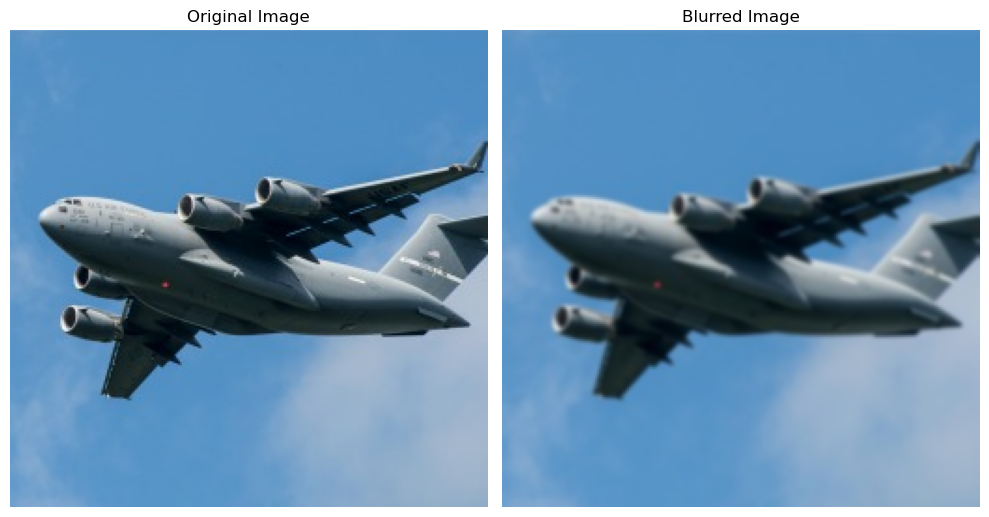

In [41]:
import cv2

# Load the image
image = cv2.imread('sim_data-master/images/plane_256x256.jpg')

kernel_size = (5, 5)  # Adjust the kernel size as needed
blurred_image = cv2.GaussianBlur(image, kernel_size, 0)

plt.figure(figsize=(10, 6))

# Original Image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

# Blurred Image
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(blurred_image, cv2.COLOR_BGR2RGB))
plt.title('Blurred Image')
plt.axis('off')

plt.tight_layout()
plt.show()

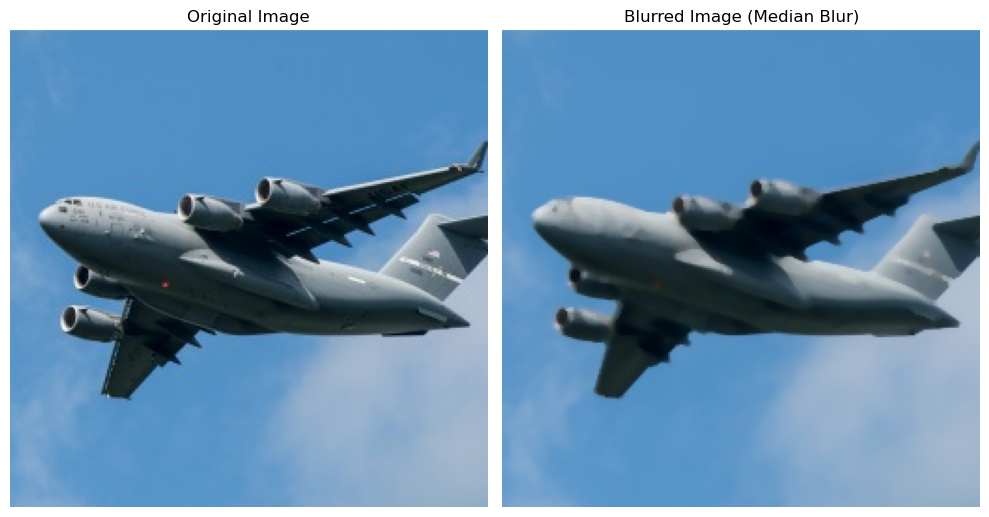

In [43]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Load and read the image
image = cv2.imread('sim_data-master/images/plane_256x256.jpg')

# Apply Median Blur to the image
kernel_size = 5  # Adjust the kernel size as needed
blurred_image = cv2.medianBlur(image, kernel_size)

# Display the original and blurred images using imshow
plt.figure(figsize=(10, 6))

# Original Image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

# Blurred Image
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(blurred_image, cv2.COLOR_BGR2RGB))
plt.title('Blurred Image (Median Blur)')
plt.axis('off')

plt.tight_layout()
plt.show()

**Edge Detection Filters:** 

**Sobel Filter:** Detects edges by convolving the image with Sobel kernels to calculate gradients.

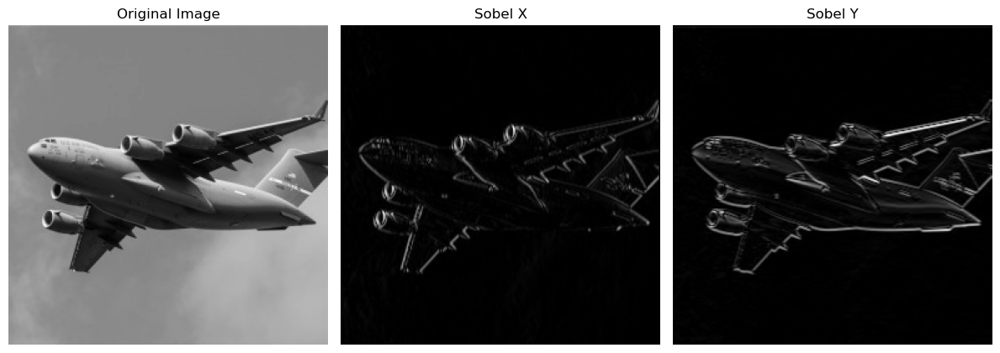

In [44]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Load and read the image
image_path = 'sim_data-master/images/plane_256x256.jpg'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply Sobel filter to the image
sobel_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)  # Sobel filter in x-direction
sobel_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)  # Sobel filter in y-direction

# Compute the gradient magnitude
gradient_magnitude = np.sqrt(sobel_x ** 2 + sobel_y ** 2)

# Display the original image and gradient magnitude using imshow
plt.figure(figsize=(12, 6))

# Original Image
plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Gradient in X-direction
plt.subplot(1, 3, 2)
plt.imshow(np.abs(sobel_x), cmap='gray')
plt.title('Sobel X')
plt.axis('off')

# Gradient in Y-direction
plt.subplot(1, 3, 3)
plt.imshow(np.abs(sobel_y), cmap='gray')
plt.title('Sobel Y')
plt.axis('off')

plt.tight_layout()
plt.show()

**Canny Edge Detector:** Applies a multi-stage algorithm to detect a wide range of edges in images.

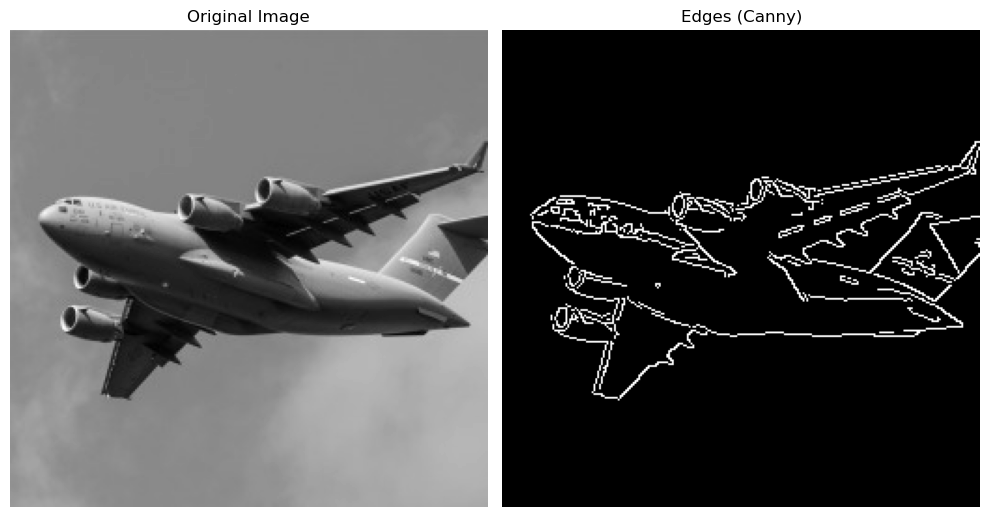

In [45]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Load and read the image
image_path = 'sim_data-master/images/plane_256x256.jpg'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply Canny edge detection to the image
edges = cv2.Canny(image, threshold1=100, threshold2=200)  # Adjust thresholds as needed

# Display the original image and the edges using imshow
plt.figure(figsize=(10, 6))

# Original Image
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Edges
plt.subplot(1, 2, 2)
plt.imshow(edges, cmap='gray')
plt.title('Edges (Canny)')
plt.axis('off')

plt.tight_layout()
plt.show()

**Sharpening Filters:**

**Laplacian Filter:** Enhances edges and details by highlighting abrupt intensity changes.

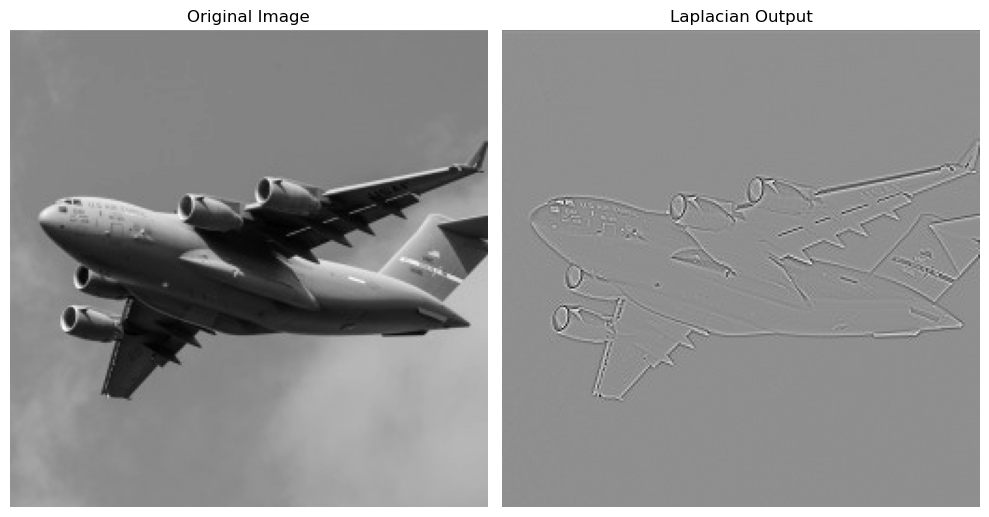

In [47]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Load and read the image
image_path = 'sim_data-master/images/plane_256x256.jpg'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply Laplacian filter to the image
laplacian = cv2.Laplacian(image, cv2.CV_64F)

# Display the original image and the Laplacian output using imshow
plt.figure(figsize=(10, 6))

# Original Image
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Laplacian Output
plt.subplot(1, 2, 2)
plt.imshow(laplacian, cmap='gray')
plt.title('Laplacian Output')
plt.axis('off')

plt.tight_layout()
plt.show()

**Unsharp Masking:** Increases image sharpness by subtracting a blurred version of the image from the original.

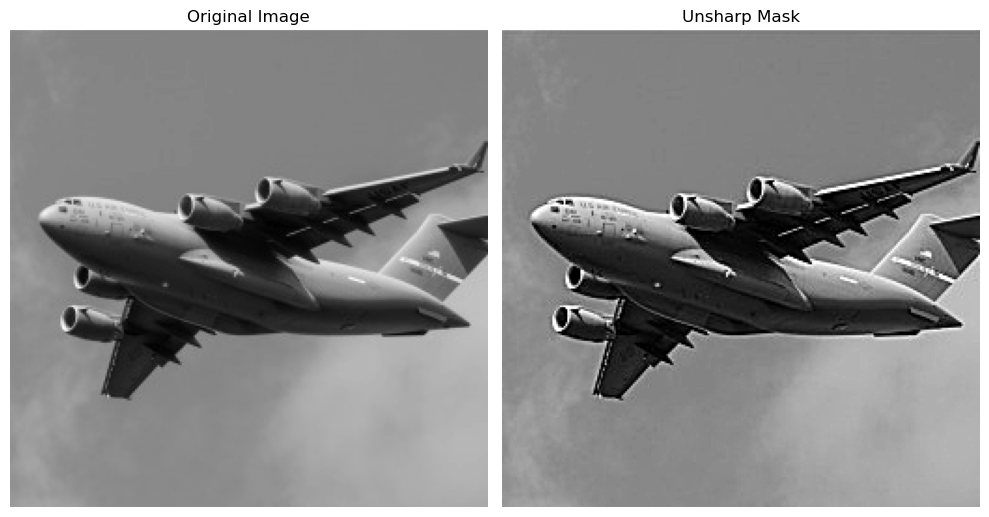

In [48]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Load and read the image
image_path = 'sim_data-master/images/plane_256x256.jpg'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply Gaussian blur to the image
blurred = cv2.GaussianBlur(image, (5, 5), 2.0)  # Adjust kernel size and sigma as needed

# Calculate the unsharp mask
unsharp_mask = cv2.addWeighted(image, 2.5, blurred, -1.5, 0)

# Display the original image and the unsharp mask using imshow
plt.figure(figsize=(10, 6))

# Original Image
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Unsharp Mask
plt.subplot(1, 2, 2)
plt.imshow(unsharp_mask, cmap='gray')
plt.title('Unsharp Mask')
plt.axis('off')

plt.tight_layout()
plt.show()

**Gradient Filters:**

**Scharr Filter:** Computes gradients with improved rotation invariance compared to Sobel filters. The Scharr filter is often used for edge detection in image processing.

In [49]:
!pip install numpy matplotlib scipy scikit-image

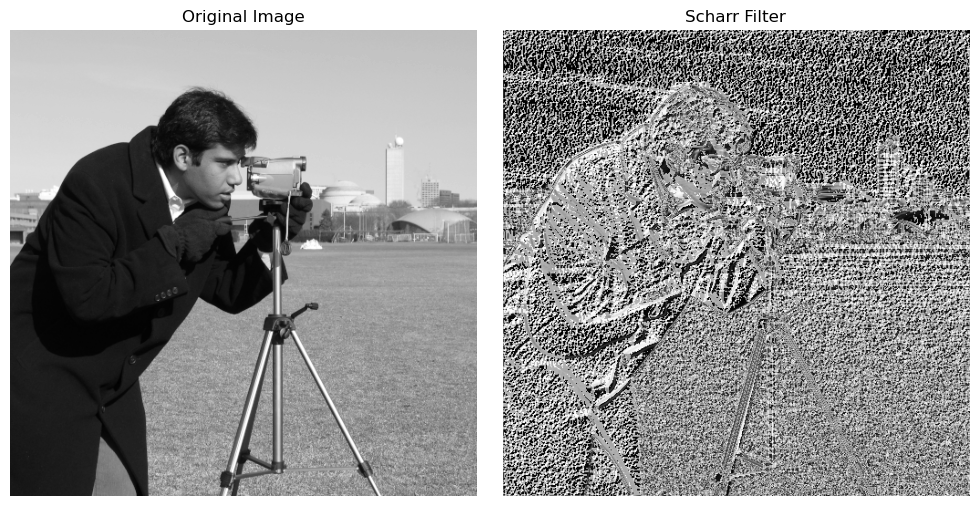

In [56]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage
from skimage import data, color

# Load an example image
image = data.camera()   # TRY ALSO THIS IMAGE
#image_path = 'sim_data-master/images/plane_256x256.jpg'
#image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Convert to grayscale if needed
if len(image.shape) > 2:
    image = color.rgb2gray(image)

# Apply the Scharr filter using scipy.ndimage
sobel_x = ndimage.sobel(image, axis=1, mode='constant')
sobel_y = ndimage.sobel(image, axis=0, mode='constant')
scharr = np.hypot(sobel_x, sobel_y)

# Display the original image and the Scharr-filtered image using imshow
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(scharr, cmap='gray')
plt.title('Scharr Filter')
plt.axis('off')

plt.tight_layout()
plt.show()

**Prewitt Filter:** Calculates image gradients using a small convolutional kernel.
The Prewitt filter is another edge detection filter

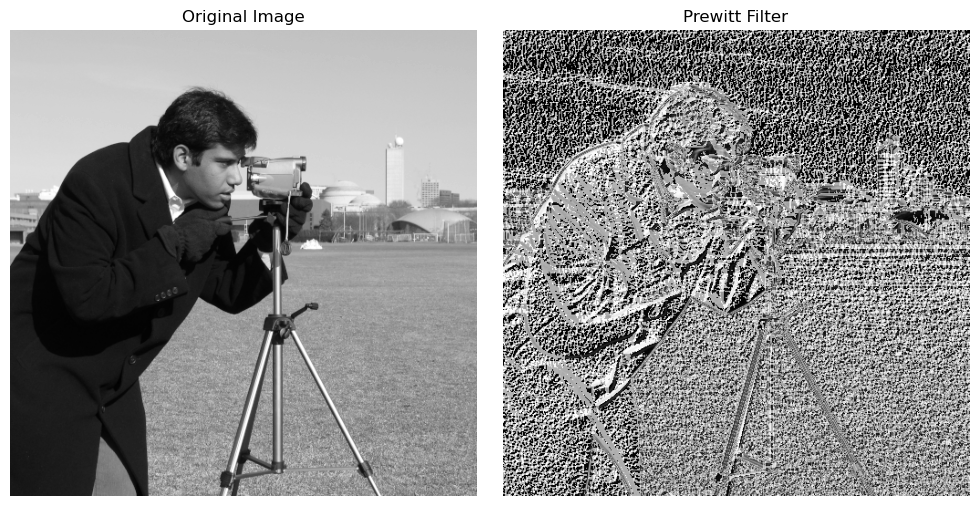

In [57]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage
from skimage import data, color

image = data.camera()  # You can replace this with your own image

# image_path = 'sim_data-master/images/plane_256x256.jpg'
# image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

if len(image.shape) > 2:
    image = color.rgb2gray(image)
    
prewitt_x = ndimage.prewitt(image, axis=1)
prewitt_y = ndimage.prewitt(image, axis=0)
prewitt = np.hypot(prewitt_x, prewitt_y)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(prewitt, cmap='gray')
plt.title('Prewitt Filter')
plt.axis('off')

plt.tight_layout()
plt.show()

**Noise Reduction Filters:**

**Bilateral Filter:** Smooths images while preserving edges by considering both spatial and intensity differences. The bilateral filter is a non-linear edge-preserving filter used for smoothing while preserving the edges in an image.

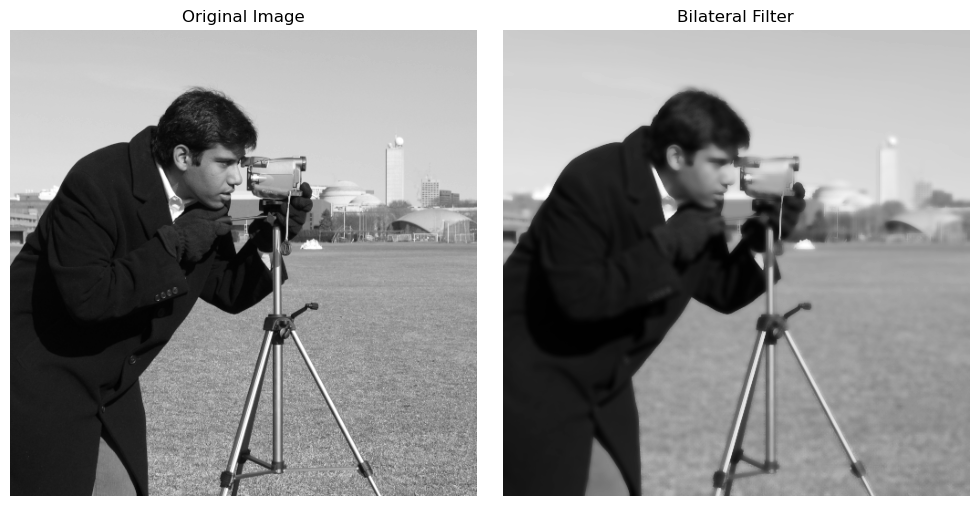

In [59]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color

image = data.camera()  # You can replace this with your own image

if len(image.shape) > 2:
    image = color.rgb2gray(image)
    
filtered_image = cv2.bilateralFilter(image, d=9, sigmaColor=75, sigmaSpace=75)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(filtered_image, cmap='gray')
plt.title('Bilateral Filter')
plt.axis('off')

plt.tight_layout()
plt.show()

**Non-local Means Filter:** Removes noise by averaging similar patches from the entire image.


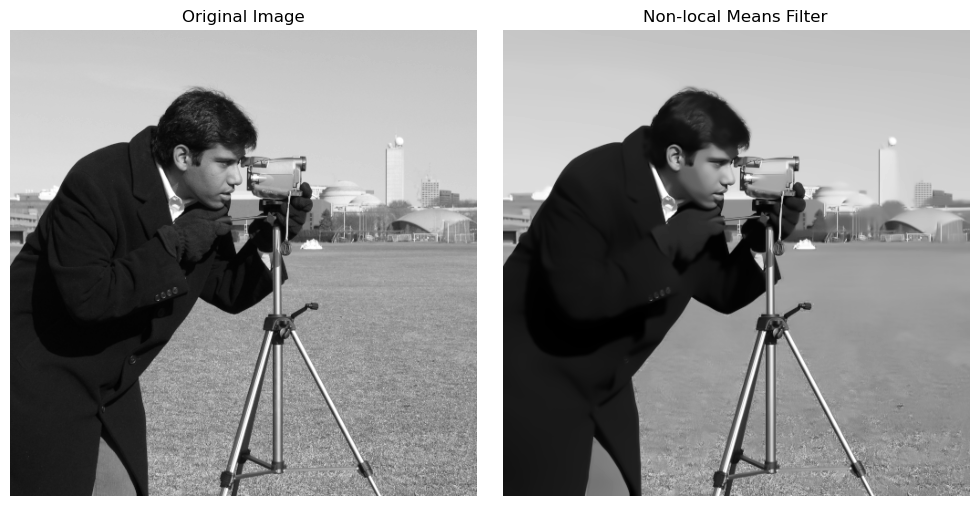

In [60]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color

image = data.camera()  # You can replace this with your own image

if len(image.shape) > 2:
    image = color.rgb2gray(image)
    
filtered_image = cv2.fastNlMeansDenoising(image, None, h=10, searchWindowSize=21)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(filtered_image, cmap='gray')
plt.title('Non-local Means Filter')
plt.axis('off')

plt.tight_layout()
plt.show()

**Morphological Filters:**

**Erosion:** Shrinks object boundaries in a binary image.

In [62]:
!pip install numpy matplotlib opencv-python scikit-image

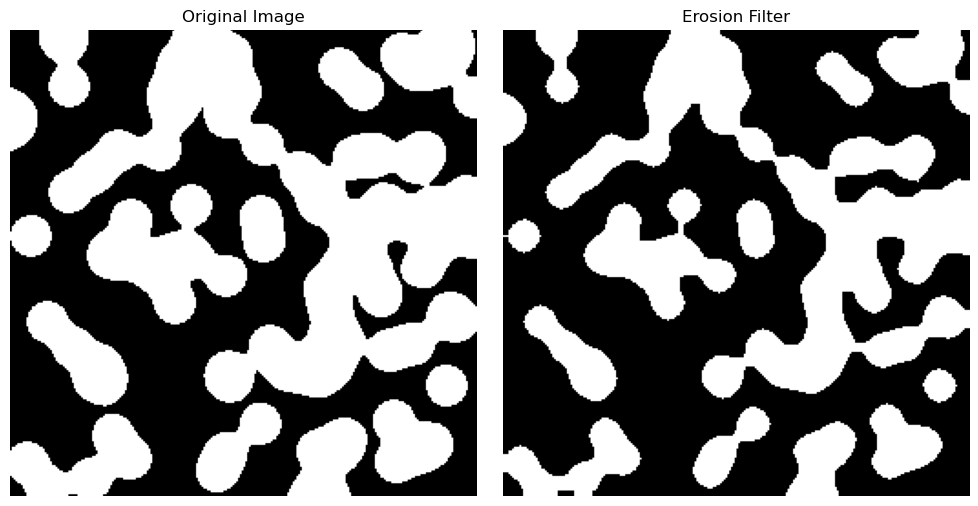

In [65]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color

# Load an example binary image
image = data.binary_blobs(length=256, n_dim=2, blob_size_fraction=0.1)

# Convert the image to grayscale if needed
if len(image.shape) > 2:
    image = color.rgb2gray(image)

# Convert the image to a suitable format for OpenCV
image_cv = np.uint8(image * 255)  # Convert to 8-bit grayscale

# Define the kernel (structuring element) for erosion
kernel = np.ones((5, 5), np.uint8)  # You can adjust the kernel size

# Apply the erosion filter to the image
eroded_image = cv2.erode(image_cv, kernel, iterations=1)

# Display the original image and the eroded image using imshow
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(eroded_image, cmap='gray')
plt.title('Erosion Filter')
plt.axis('off')

plt.tight_layout()
plt.show()

**Dilation:** Expands object boundaries in a binary image.

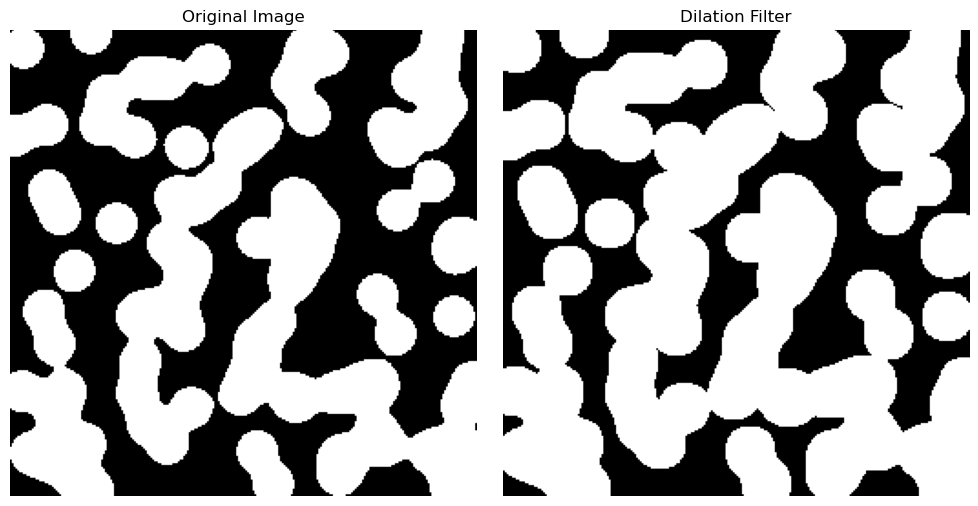

In [67]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color

# Load an example binary image
image = data.binary_blobs(length=256, n_dim=2, blob_size_fraction=0.1)

# Convert the image to grayscale if needed
if len(image.shape) > 2:
    image = color.rgb2gray(image)

# Convert the image to a suitable format for OpenCV
image_cv = np.uint8(image * 255)  # Convert to 8-bit grayscale

# Define the kernel (structuring element) for dilation
kernel = np.ones((5, 5), np.uint8)  # You can adjust the kernel size

# Apply the dilation filter to the image
dilated_image = cv2.dilate(image_cv, kernel, iterations=1)

# Display the original image and the dilated image using imshow
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(dilated_image, cmap='gray')
plt.title('Dilation Filter')
plt.axis('off')

plt.tight_layout()
plt.show()

**Opening:** Erosion followed by dilation; useful for noise reduction.

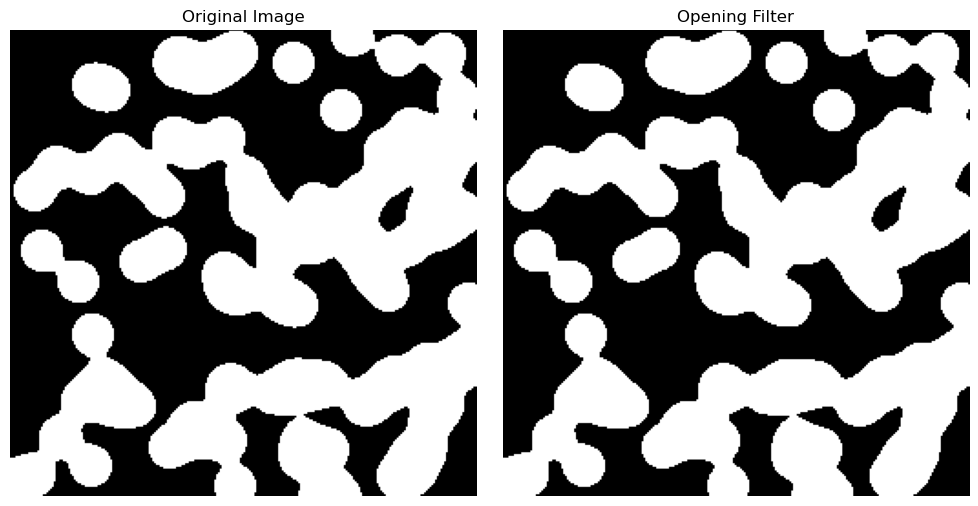

In [69]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color

# Load an example binary image
image = data.binary_blobs(length=256, n_dim=2, blob_size_fraction=0.1)

# Convert the image to grayscale if needed
if len(image.shape) > 2:
    image = color.rgb2gray(image)

# Convert the image to a suitable format for OpenCV
image_cv = np.uint8(image * 255)  # Convert to 8-bit grayscale

# Define the kernel (structuring element) for opening
kernel = np.ones((5, 5), np.uint8)  # You can adjust the kernel size

# Apply the opening filter to the image
opened_image = cv2.morphologyEx(image_cv, cv2.MORPH_OPEN, kernel)

# Display the original image and the opened image using imshow
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(opened_image, cmap='gray')
plt.title('Opening Filter')
plt.axis('off')

plt.tight_layout()
plt.show()

**Closing:** Dilation followed by erosion; helps to close small gaps between objects.

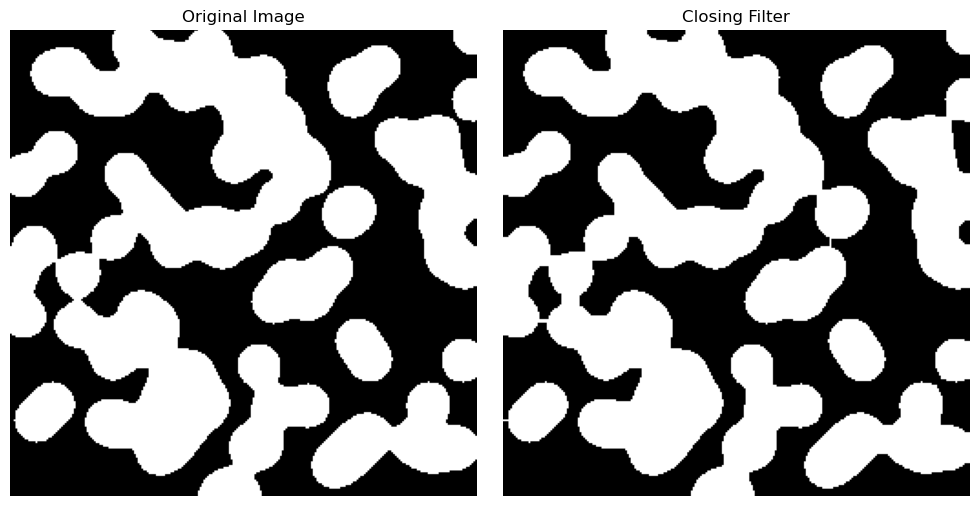

In [71]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color

# Load an example binary image
image = data.binary_blobs(length=256, n_dim=2, blob_size_fraction=0.1)

# Convert the image to grayscale if needed
if len(image.shape) > 2:
    image = color.rgb2gray(image)

# Convert the image to a suitable format for OpenCV
image_cv = np.uint8(image * 255)  # Convert to 8-bit grayscale

# Define the kernel (structuring element) for closing
kernel = np.ones((5, 5), np.uint8)  # You can adjust the kernel size

# Apply the closing filter to the image
closed_image = cv2.morphologyEx(image_cv, cv2.MORPH_CLOSE, kernel)

# Display the original image and the closed image using imshow
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(closed_image, cmap='gray')
plt.title('Closing Filter')
plt.axis('off')

plt.tight_layout()
plt.show()

**Color Filters:**

Color filters in image processing are operations that modify the color channels of an image to achieve certain effects.

**Grayscale Filter:**
This filter converts a color image into grayscale by averaging the color channels.

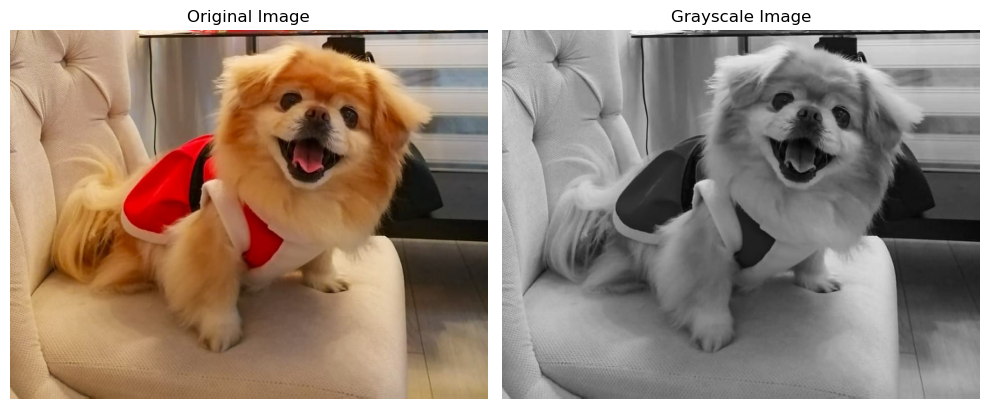

In [89]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color

# Load an example image
image = plt.imread("sim_data-master/images/dog.jpeg")  # Replace with your image path

# Convert the image to grayscale
gray_image = color.rgb2gray(image)

# Display the original and grayscale images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(gray_image, cmap='gray')
plt.title('Grayscale Image')
plt.axis('off')

plt.tight_layout()
plt.show()

**Color Inversion Filter:**
This filter inverts the color of each pixel.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


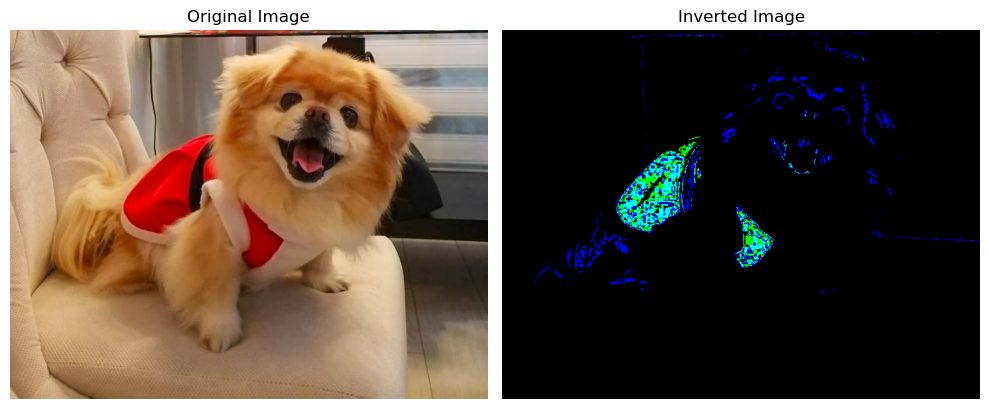

In [91]:
def apply_color_inversion(image):
    inverted_image = 1.0 - image
    return inverted_image

# Load an example image
image = plt.imread("sim_data-master/images/dog.jpeg")  # Replace with your image path

# Apply color inversion filter
inverted_image = apply_color_inversion(image)

# Display the original and inverted images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(inverted_image)
plt.title('Inverted Image')
plt.axis('off')

plt.tight_layout()
plt.show()

**Color thresholding** is a technique used to segment an image based on color. It involves creating binary masks where pixels that meet certain color criteria are set to one value (e.g., white) and pixels that don't meet the criteria are set to another value (e.g., black).

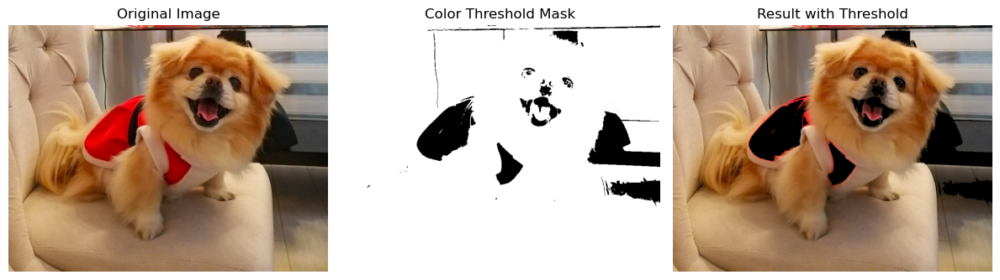

In [98]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load an example image
image = cv2.imread("sim_data-master/images/dog.jpeg")  # Replace with your image path
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

# Define the color range for thresholding (lower and upper bounds)
lower_bound = np.array([50, 20, 0], dtype=np.uint8)
upper_bound = np.array([255, 255, 255], dtype=np.uint8)

# Create a binary mask using inRange function
mask = cv2.inRange(image, lower_bound, upper_bound)

# Apply the mask to the original image
result = cv2.bitwise_and(image, image, mask=mask)

# Display the original image, mask, and result
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(mask, cmap='gray')
plt.title('Color Threshold Mask')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(result)
plt.title('Result with Threshold')
plt.axis('off')

plt.tight_layout()
plt.show()

**Channel Separation:** Separates channels in color images to manipulate individual color components.

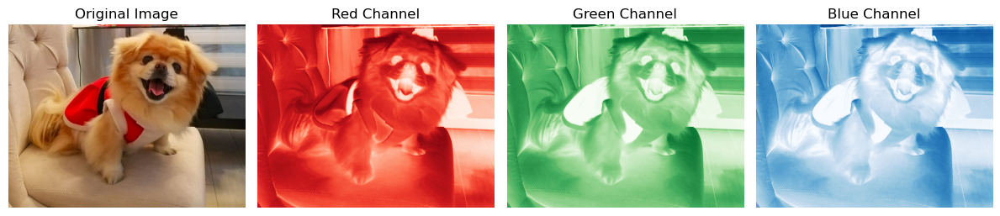

In [103]:
import numpy as np
import matplotlib.pyplot as plt

# Load an example image
image = cv2.imread("sim_data-master/images/dog.jpeg")  # Replace with your image path
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

# Separate color channels
red_channel = image[:, :, 0]
green_channel = image[:, :, 1]
blue_channel = image[:, :, 2]

# Display the original image and separated color channels
plt.figure(figsize=(12, 4))

plt.subplot(1, 4, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(red_channel, cmap='Reds')
plt.title('Red Channel')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(green_channel, cmap='Greens')
plt.title('Green Channel')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(blue_channel, cmap='Blues')
plt.title('Blue Channel')
plt.axis('off')

plt.tight_layout()
plt.show()

**Filtering an image in the HSL** (Hue, Saturation, Lightness) color space involves manipulating the individual H, S, and L channels to achieve various effects. 

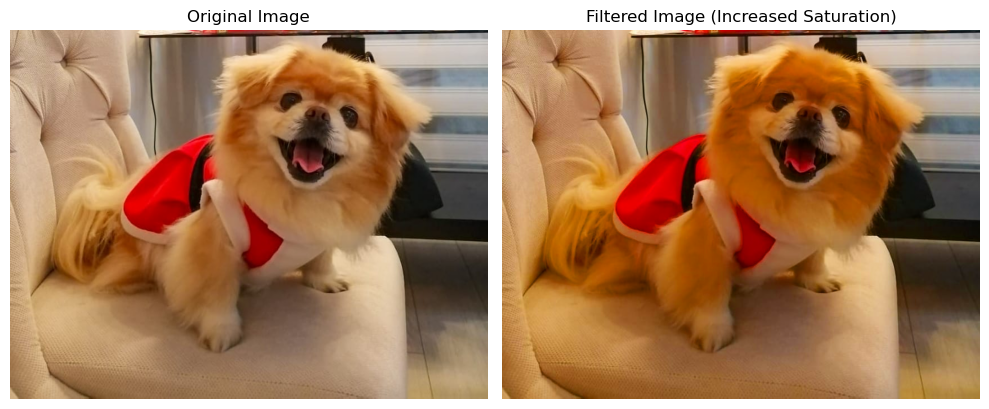

In [104]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import color

# Load an example image
image = cv2.imread("sim_data-master/images/dog.jpeg")  # Replace with your image path
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

# Convert the image to the HSL color space
image_hsl = color.rgb2hsv(image_rgb)  # HSL is the same as HSV

# Apply the saturation filter (increase saturation)
saturation_factor = 1.5  # Adjust the saturation factor as desired
image_hsl[:, :, 1] *= saturation_factor
image_hsl[:, :, 1] = np.clip(image_hsl[:, :, 1], 0, 1)  # Ensure values stay within [0, 1]

# Convert the modified HSL image back to RGB
filtered_image_rgb = color.hsv2rgb(image_hsl)

# Display the original image and the filtered image
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(filtered_image_rgb)
plt.title('Filtered Image (Increased Saturation)')
plt.axis('off')

plt.tight_layout()
plt.show()

**Filtering an image in the HSV** (Hue, Saturation, Value) color space involves manipulating the individual H, S, and V channels to achieve various effects. 

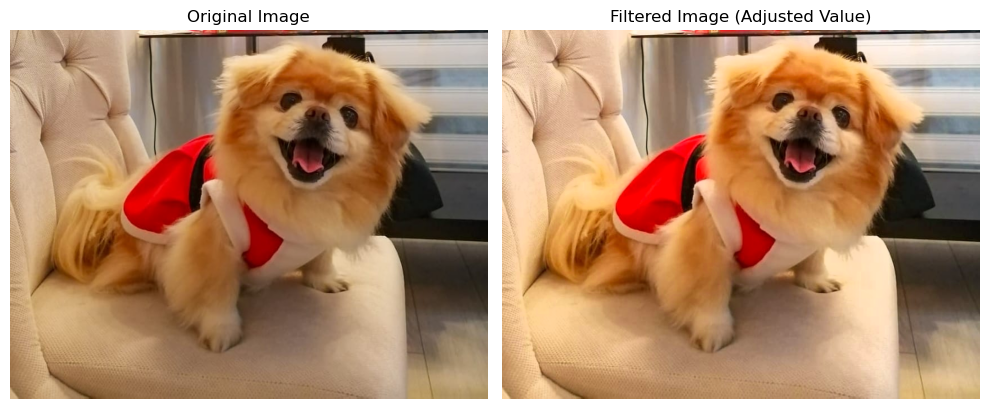

In [107]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load an example image
image = cv2.imread("sim_data-master/images/dog.jpeg")  # Replace with your image path
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

# Convert the image to the HSV color space
image_hsv = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2HSV)

# Apply the value filter (adjust brightness/contrast)
value_factor = 1.2  # Adjust the value factor as desired
image_hsv[:, :, 2] = np.clip(image_hsv[:, :, 2] * value_factor, 0, 255)

# Convert the modified HSV image back to RGB
filtered_image_rgb = cv2.cvtColor(image_hsv, cv2.COLOR_HSV2RGB)

# Display the original image and the filtered image
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(filtered_image_rgb)
plt.title('Filtered Image (Adjusted Value)')
plt.axis('off')

plt.tight_layout()
plt.show()

**Hough Transform:**
Detects shapes like lines and circles in an image by transforming the image space into parameter spaces.

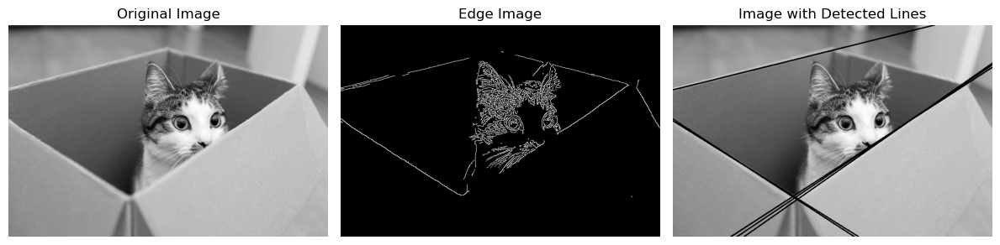

In [125]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image = cv2.imread("sim_data-master/images/cat.jpg", cv2.IMREAD_GRAYSCALE)  # Replace with your image path

edges = cv2.Canny(image, threshold1=110, threshold2=150)  # Apply Canny edge detection
lines = cv2.HoughLines(edges, 1, np.pi/180, threshold=120)  # Apply Hough Line Transform

# Draw the detected lines on a copy of the original image
line_image = np.copy(image)
if lines is not None:
    for line in lines:
        rho, theta = line[0]
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho
        x1 = int(x0 + 1000 * (-b))
        y1 = int(y0 + 1000 * (a))
        x2 = int(x0 - 1000 * (-b))
        y2 = int(y0 - 1000 * (a))
        cv2.line(line_image, (x1, y1), (x2, y2), (0, 0, 255), 2)
        
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(edges, cmap='gray')
plt.title('Edge Image')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(line_image, cmap='gray')
plt.title('Image with Detected Lines')
plt.axis('off')

plt.tight_layout()
plt.show()

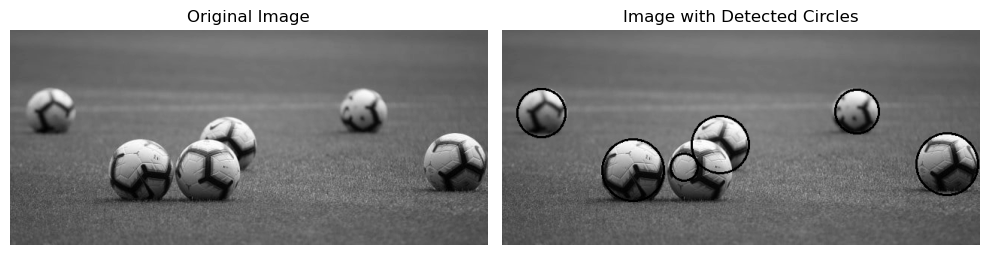

In [116]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image = cv2.imread("sim_data-master/images/ballons.jpg", cv2.IMREAD_GRAYSCALE)  # Replace with your image path

# Apply Gaussian blur to reduce noise and improve circle detection
blurred_image = cv2.GaussianBlur(image, (9, 9), 2)

# Apply Hough Circle Transform
circles = cv2.HoughCircles(
    blurred_image, cv2.HOUGH_GRADIENT, dp=1, minDist=50,
    param1=100, param2=30, minRadius=10, maxRadius=100
)

# Draw detected circles on a copy of the original image
circle_image = np.copy(image)
if circles is not None:
    circles = np.uint16(np.around(circles))
    for circle in circles[0, :]:
        center = (circle[0], circle[1])
        radius = circle[2]
        cv2.circle(circle_image, center, radius, (0, 255, 0), 2)
        
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(circle_image, cmap='gray')
plt.title('Image with Detected Circles')
plt.axis('off')

plt.tight_layout()
plt.show()

**Frequency domain filtering** is used to process images by modifying their frequency components using techniques like low-pass, high-pass, or band-pass filters. 

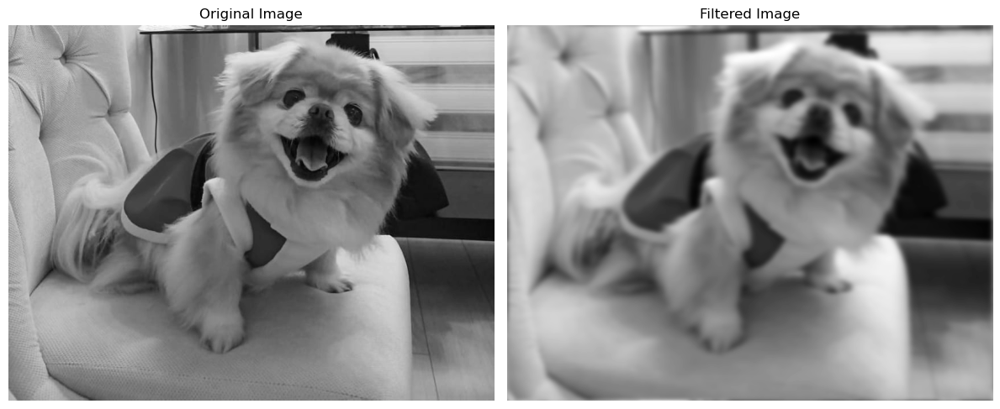

In [129]:
#low-pass frequency filter

import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import fftpack

# Load an example image
image = cv2.imread("sim_data-master/images/dog.jpeg", cv2.IMREAD_GRAYSCALE)  # Replace with your image path
#image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

# Convert image to floating-point type
image_float = np.float32(image)

# Perform FFT (Fast Fourier Transform) on the image
fft_image = fftpack.fft2(image_float)

# Shift the zero frequency component to the center
fft_shifted = fftpack.fftshift(fft_image)

# Create a Gaussian low-pass filter
rows, cols = image.shape
center_row, center_col = rows // 2, cols // 2
filter_radius = 30  # Adjust the radius of the filter
low_pass_filter = np.zeros((rows, cols), dtype=np.float32)
for i in range(rows):
    for j in range(cols):
        distance = np.sqrt((i - center_row)**2 + (j - center_col)**2)
        low_pass_filter[i, j] = np.exp(-0.5 * (distance / filter_radius)**2)

# Apply the filter in the frequency domain
filtered_shifted = fft_shifted * low_pass_filter

# Perform inverse FFT to get the filtered image in spatial domain
filtered_image = np.real(fftpack.ifft2(fftpack.ifftshift(filtered_shifted)))
filtered_image = np.clip(filtered_image, 0, 255).astype(np.uint8)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(filtered_image, cmap='gray')
plt.title('Filtered Image')
plt.axis('off')

plt.tight_layout()
plt.show()

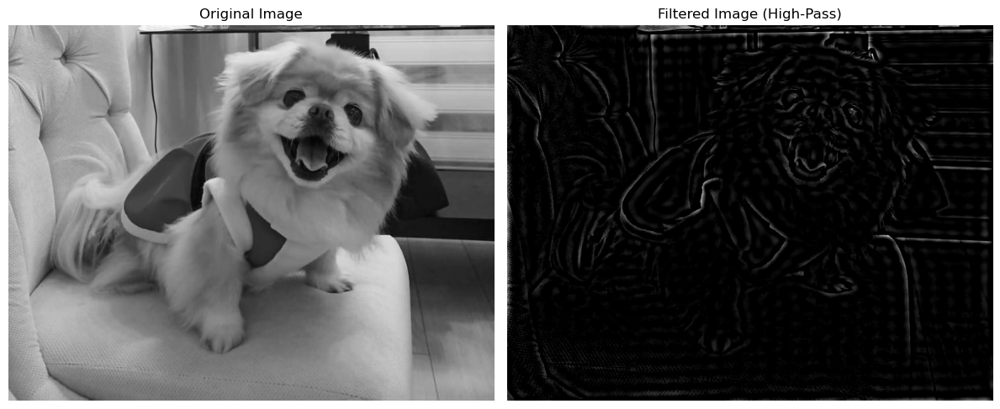

In [130]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import fftpack

# Load an example image
image = cv2.imread("sim_data-master/images/dog.jpeg", cv2.IMREAD_GRAYSCALE)  # Replace with your image path
#image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

# Convert image to floating-point type
image_float = np.float32(image)

# Perform FFT (Fast Fourier Transform) on the image
fft_image = fftpack.fft2(image_float)

# Shift the zero frequency component to the center
fft_shifted = fftpack.fftshift(fft_image)

# Create a high-pass filter
rows, cols = image.shape
center_row, center_col = rows // 2, cols // 2
filter_radius = 30  # Adjust the radius of the filter
high_pass_filter = np.ones((rows, cols), dtype=np.float32)
for i in range(rows):
    for j in range(cols):
        distance = np.sqrt((i - center_row)**2 + (j - center_col)**2)
        if distance <= filter_radius:
            high_pass_filter[i, j] = 0

# Apply the filter in the frequency domain
filtered_shifted = fft_shifted * high_pass_filter

# Perform inverse FFT to get the filtered image in spatial domain
filtered_image = np.real(fftpack.ifft2(fftpack.ifftshift(filtered_shifted)))
filtered_image = np.clip(filtered_image, 0, 255).astype(np.uint8)

# Display original and filtered images
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(filtered_image, cmap='gray')
plt.title('Filtered Image (High-Pass)')
plt.axis('off')

plt.tight_layout()
plt.show()

Visualizing the Fourier components of an image involves plotting the magnitude spectrum and phase spectrum of its Fourier Transform.

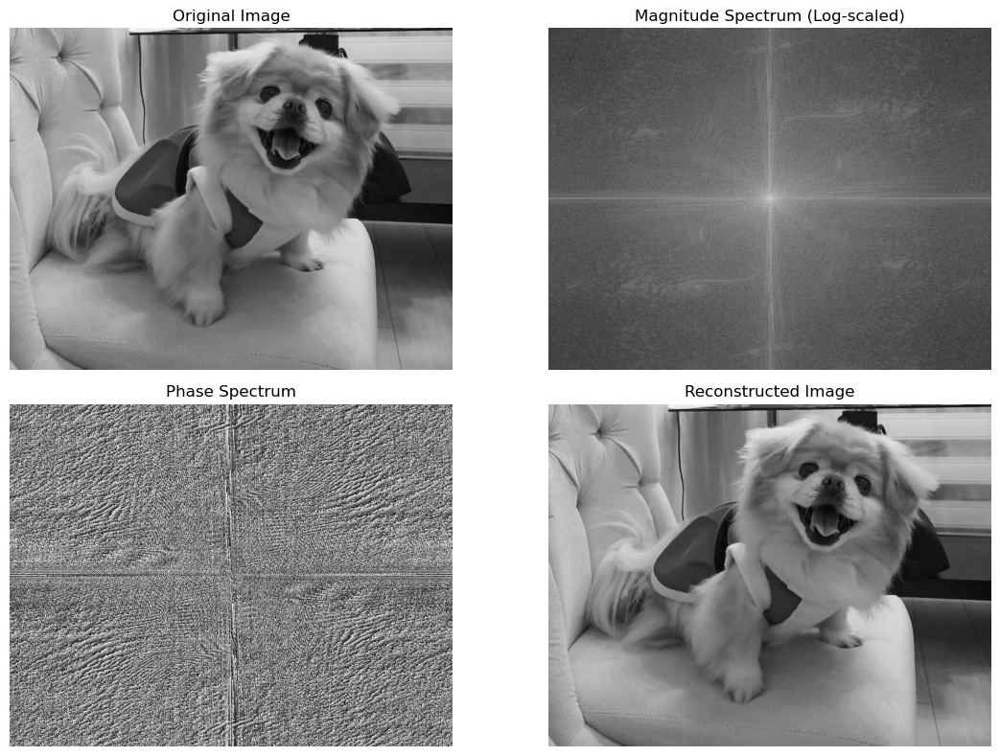

In [132]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import fftpack

# Load an example image
image = cv2.imread("sim_data-master/images/dog.jpeg", cv2.IMREAD_GRAYSCALE) 

# Convert image to floating-point type
image_float = np.float32(image)

# Perform FFT (Fast Fourier Transform) on the image
fft_image = fftpack.fft2(image_float)

# Shift the zero frequency component to the center
fft_shifted = fftpack.fftshift(fft_image)

# Calculate the magnitude spectrum and phase spectrum
magnitude_spectrum = np.abs(fft_shifted)
phase_spectrum = np.angle(fft_shifted)

# Display the original image and the Fourier components
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(np.log(1 + magnitude_spectrum), cmap='gray')
plt.title('Magnitude Spectrum (Log-scaled)')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(phase_spectrum, cmap='gray')
plt.title('Phase Spectrum')
plt.axis('off')

plt.subplot(2, 2, 4)
reconstructed_image = np.real(fftpack.ifft2(fftpack.ifftshift(fft_shifted)))
plt.imshow(reconstructed_image, cmap='gray')
plt.title('Reconstructed Image')
plt.axis('off')

plt.tight_layout()
plt.show()

**magnitude spectrum threshold filtering**

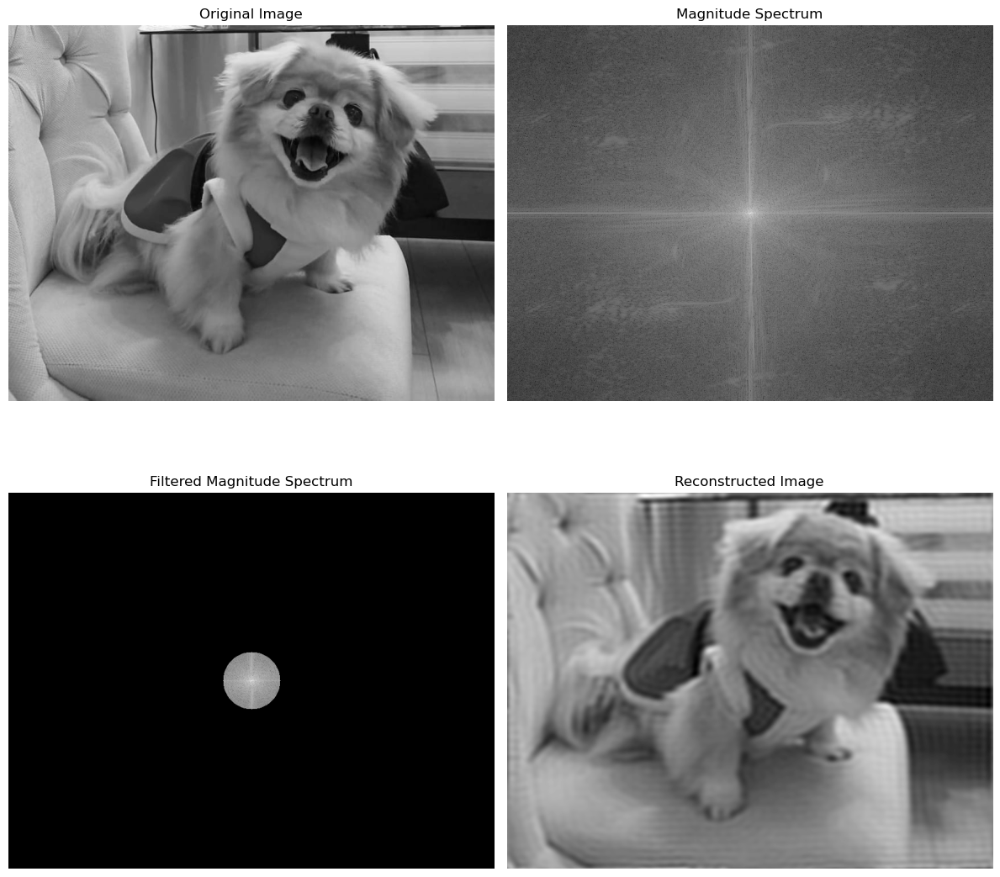

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import fftpack

# Load an example image
image = cv2.imread("sim_data-master/images/dog.jpeg", cv2.IMREAD_GRAYSCALE) 

# Convert image to floating-point type
image_float = np.float32(image)

# Perform FFT (Fast Fourier Transform) on the image
fft_image = fftpack.fft2(image_float)

# Shift the zero frequency component to the center
fft_shifted = fftpack.fftshift(fft_image)

# Calculate the magnitude spectrum
magnitude_spectrum = np.abs(fft_shifted)

# Define frequency ranges for filtering (e.g., a small circular region)
center_row, center_col = magnitude_spectrum.shape[0] // 2, magnitude_spectrum.shape[1] // 2
radius = 50  # Adjust the radius of the circular region
y, x = np.ogrid[-center_row:magnitude_spectrum.shape[0] - center_row,
                -center_col:magnitude_spectrum.shape[1] - center_col]
mask = x**2 + y**2 <= radius**2

# Apply the mask to the magnitude spectrum
filtered_magnitude_spectrum = np.where(mask, magnitude_spectrum, 0)

# Reconstruct the image using the filtered magnitude spectrum
filtered_fft_shifted = fft_shifted * (filtered_magnitude_spectrum / (magnitude_spectrum + 1e-8))
reconstructed_image = np.real(fftpack.ifft2(fftpack.ifftshift(filtered_fft_shifted)))

# Display original image, magnitude spectrum, filtered magnitude spectrum, and reconstructed image
plt.figure(figsize=(12, 12))

plt.subplot(2, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(np.log(1 + magnitude_spectrum), cmap='gray')
plt.title('Magnitude Spectrum')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(np.log(1 + filtered_magnitude_spectrum), cmap='gray')
plt.title('Filtered Magnitude Spectrum')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(reconstructed_image, cmap='gray')
plt.title('Reconstructed Image')
plt.axis('off')

plt.tight_layout()
plt.show()

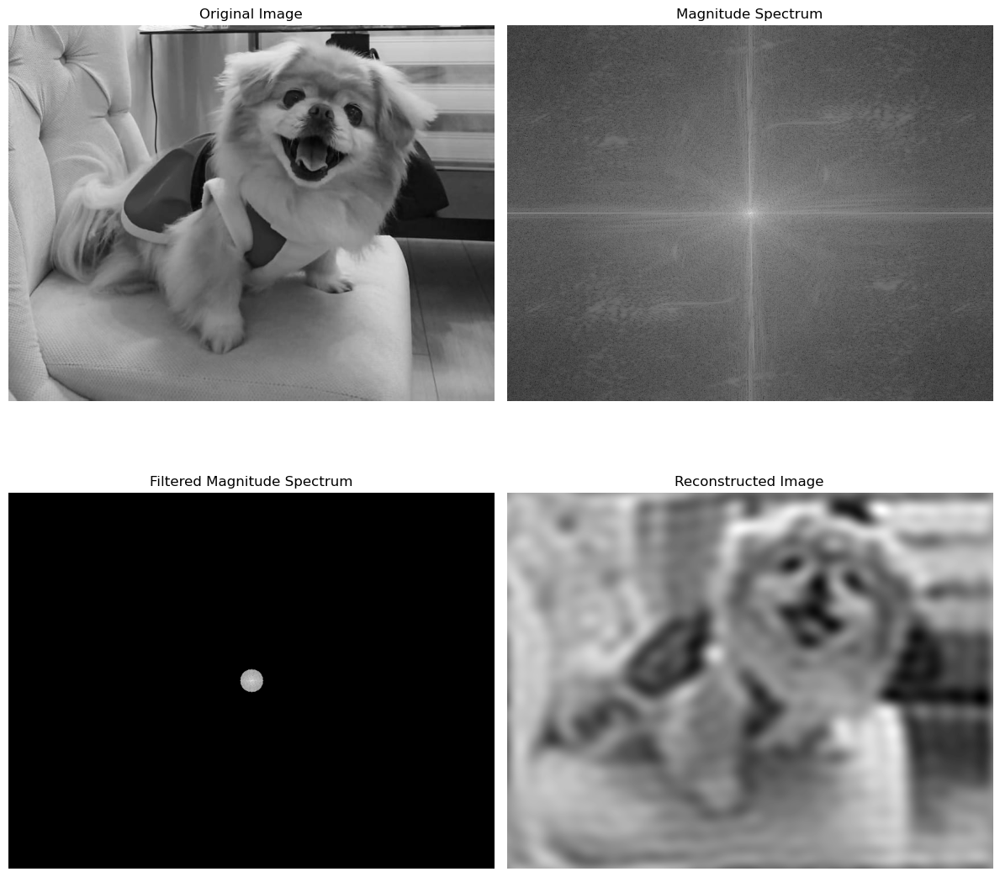

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import fftpack

# Load an example image
image = cv2.imread("sim_data-master/images/dog.jpeg", cv2.IMREAD_GRAYSCALE) 

# Convert image to floating-point type
image_float = np.float32(image)

# Perform FFT (Fast Fourier Transform) on the image
fft_image = fftpack.fft2(image_float)

# Shift the zero frequency component to the center
fft_shifted = fftpack.fftshift(fft_image)

# Calculate the magnitude spectrum
magnitude_spectrum = np.abs(fft_shifted)

# Define frequency ranges for filtering (e.g., a small circular region)
center_row, center_col = magnitude_spectrum.shape[0] // 2, magnitude_spectrum.shape[1] // 2
radius = 20  # Adjust the radius of the circular region
y, x = np.ogrid[-center_row:magnitude_spectrum.shape[0] - center_row,
                -center_col:magnitude_spectrum.shape[1] - center_col]
mask = x**2 + y**2 <= radius**2

# Apply the mask to the magnitude spectrum
filtered_magnitude_spectrum = np.where(mask, magnitude_spectrum, 0)

# Reconstruct the image using the filtered magnitude spectrum
filtered_fft_shifted = fft_shifted * (filtered_magnitude_spectrum / (magnitude_spectrum + 1e-8))
reconstructed_image = np.real(fftpack.ifft2(fftpack.ifftshift(filtered_fft_shifted)))

# Display original image, magnitude spectrum, filtered magnitude spectrum, and reconstructed image
plt.figure(figsize=(12, 12))

plt.subplot(2, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(np.log(1 + magnitude_spectrum), cmap='gray')
plt.title('Magnitude Spectrum')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(np.log(1 + filtered_magnitude_spectrum), cmap='gray')
plt.title('Filtered Magnitude Spectrum')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(reconstructed_image, cmap='gray')
plt.title('Reconstructed Image')
plt.axis('off')

plt.tight_layout()
plt.show()